<a href="https://colab.research.google.com/github/Zaki070/Cell-segmentation-from-telecentric-bright-field-transmitted-light-microscopy-images-using-U-Net/blob/main/Cell_Segmentation_UNE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Importing Libraries**

In [ ]:
  import numpy as np
  import cv2
  import pandas as pd
  from matplotlib import pyplot as plt
  from skimage.transform import resize
  from skimage import measure, color, io
  from skimage.measure import label, regionprops
  from tqdm import tqdm
  from tensorflow.keras.layers import BatchNormalization
  from tensorflow.keras.layers import UpSampling2D



## **Google drive loading**

In [ ]:
!pwd
from google.colab import drive
drive.mount('/content/drive')

/content
Mounted at /content/drive


##**Loading the Data**

In [ ]:
seed=24
batch_size= 4
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_gen_args = dict(rescale = 1/255.,
rotation_range=90, width_shift_range=0.3, height_shift_range=0.3, shear_range=0.5, zoom_range=0.3,horizontal_flip=True,vertical_flip=True,
fill_mode='reflect')

mask_gen_args = dict(rescale = 1/255., rotation_range=90,width_shift_range=0.3, height_shift_range=0.3,shear_range=0.5,
zoom_range=0.3,horizontal_flip=True,vertical_flip=True, fill_mode='reflect',
preprocessing_function = lambda x: np.where(x>0, 1, 0).astype(x.dtype))

In [ ]:
image_data_generator = ImageDataGenerator(**img_gen_args)
image_generator = image_data_generator.flow_from_directory("/content/drive/MyDrive/Dataset/spilit_x_image_train/",  seed=seed,
batch_size=batch_size,target_size=(512, 512),class_mode=None)


mask_data_generator = ImageDataGenerator(**mask_gen_args)
mask_generator = mask_data_generator.flow_from_directory("/content/drive/MyDrive/Dataset/spilit_y_mask_train/",
seed=seed, batch_size=batch_size,target_size=(512, 512),
color_mode = 'grayscale',  class_mode=None)


valid_img_generator = image_data_generator.flow_from_directory("/content/drive/MyDrive/Dataset/spilit_x_image_validate/",
 seed=seed, batch_size=batch_size,  target_size=(512, 512), class_mode=None)
valid_mask_generator = mask_data_generator.flow_from_directory("/content/drive/MyDrive/Dataset/spilit_y_mask_validate/",
 seed=seed, batch_size=batch_size, target_size=(512, 512), color_mode = 'grayscale',   #Read masks in grayscale
 class_mode=None)

training_set_generator = zip(image_generator, mask_generator)
validation_set_generator = zip(valid_img_generator, valid_mask_generator)

Found 320 images belonging to 1 classes.
Found 320 images belonging to 1 classes.
Found 80 images belonging to 1 classes.
Found 80 images belonging to 1 classes.


# **EDA for the Data**

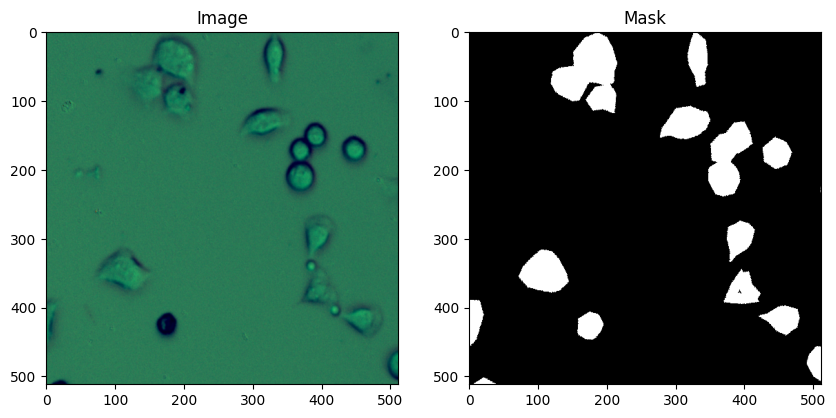

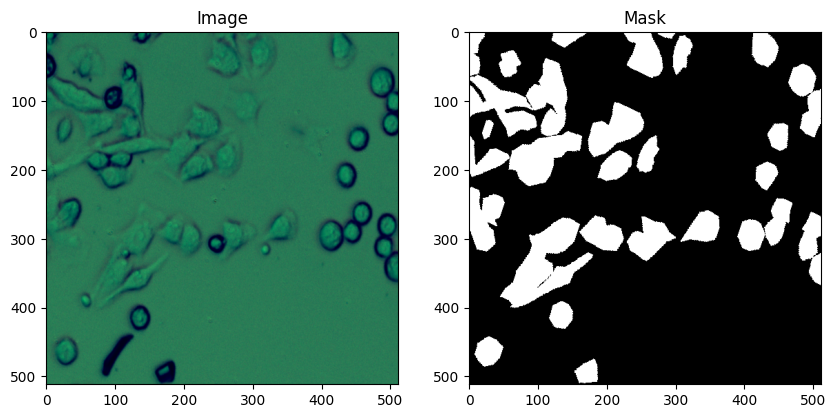

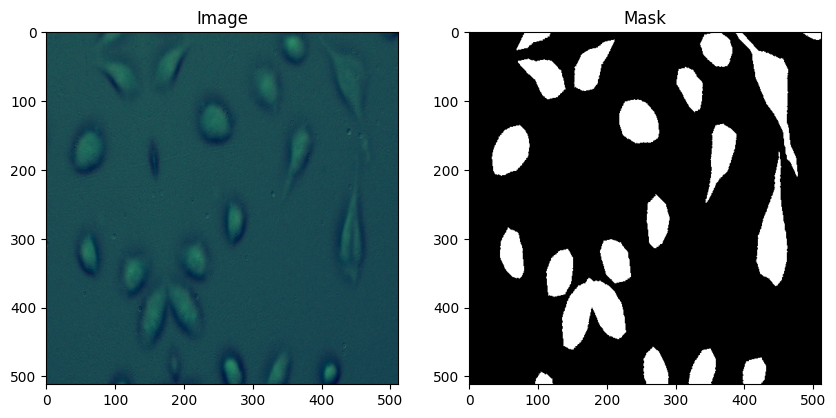

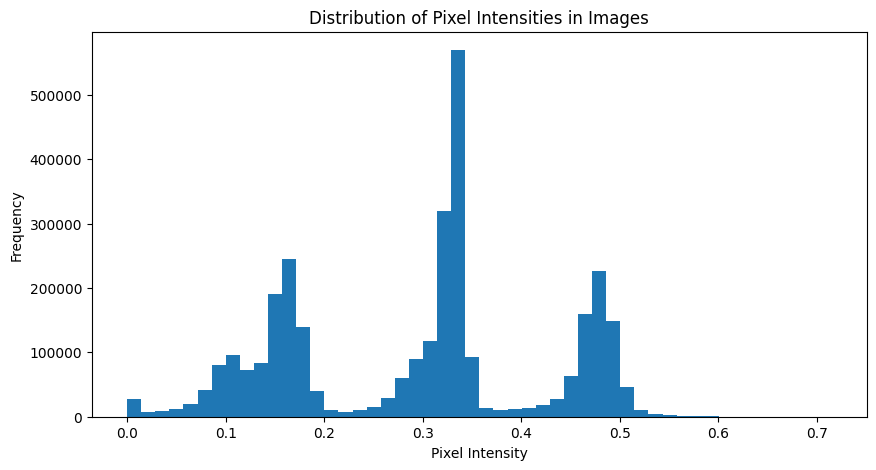

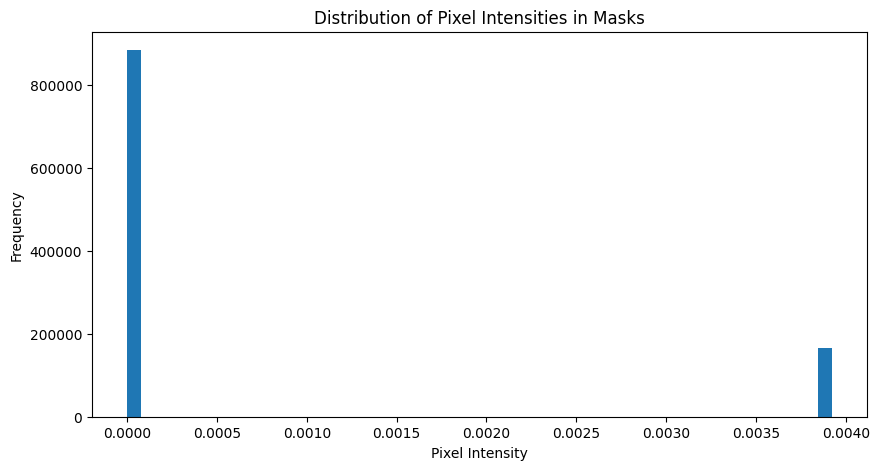

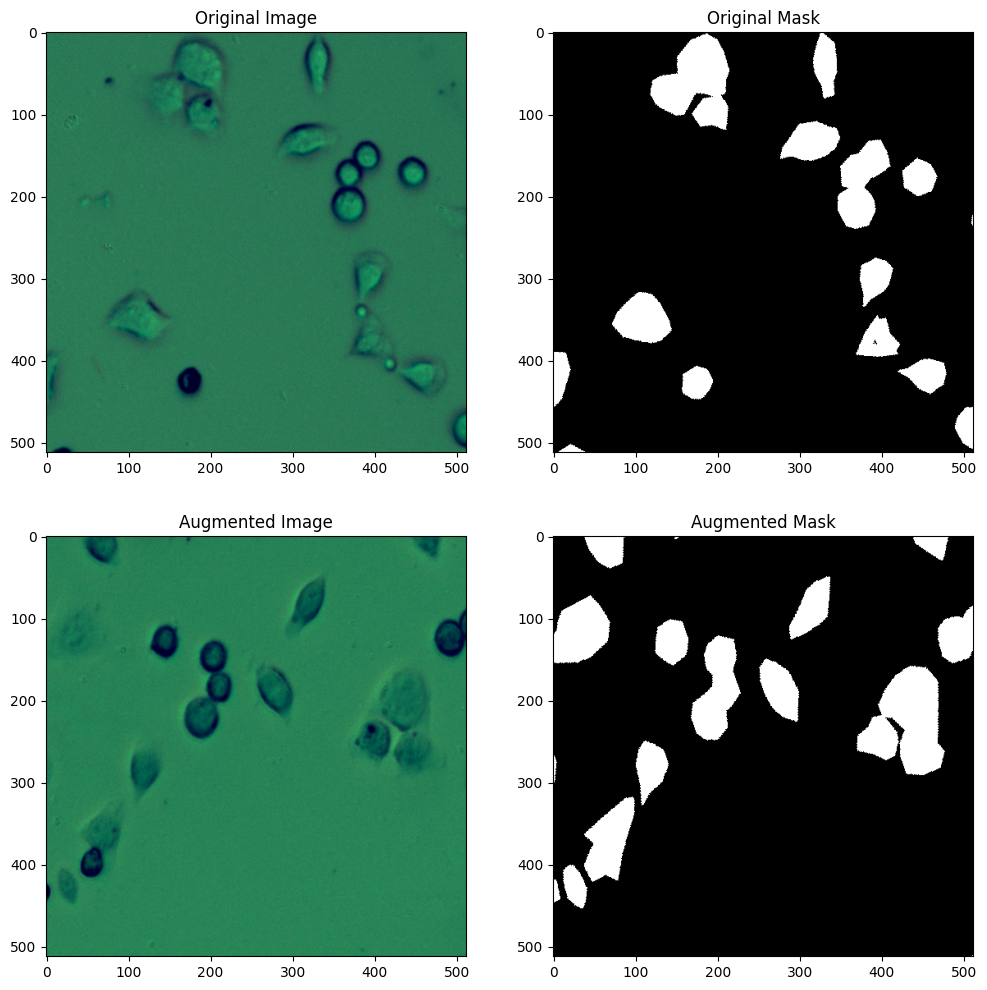

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to visualize images and masks
def visualize_data(images, masks):
    n = 3

    for i in range(n):
        img = images[i]
        mask = masks[i]

        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        ax[0].imshow(img)
        ax[0].set_title('Image')
        ax[1].imshow(mask.squeeze(), cmap='gray')
        ax[1].set_title('Mask')
        plt.show()


images, masks = next(training_set_generator)

visualize_data(images, masks)

pixel_intensities = images.flatten()

plt.figure(figsize=(10, 5))
plt.hist(pixel_intensities, bins=50)
plt.title('Distribution of Pixel Intensities in Images')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

# Finding distribution of pixel intensities in the masks
mask_pixel_intensities = masks.flatten()

plt.figure(figsize=(10, 5))
plt.hist(mask_pixel_intensities, bins=50)
plt.title('Distribution of Pixel Intensities in Masks')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()
augmented_images, augmented_masks = next(training_set_generator)
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0, 0].imshow(images[0])
ax[0, 0].set_title('Original Image')

ax[0, 1].imshow(masks[0].squeeze(), cmap='gray')
ax[0, 1].set_title('Original Mask')

ax[1, 0].imshow(augmented_images[0])
ax[1, 0].set_title('Augmented Image')

ax[1, 1].imshow(augmented_masks[0].squeeze(), cmap='gray')
ax[1, 1].set_title('Augmented Mask')

plt.show()


## **Analysis of Image Pixel Intensities and Mask Areas**




100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


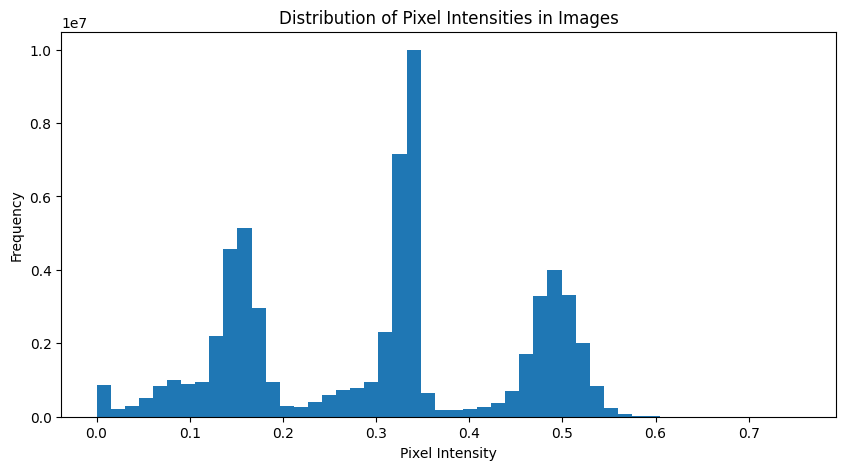

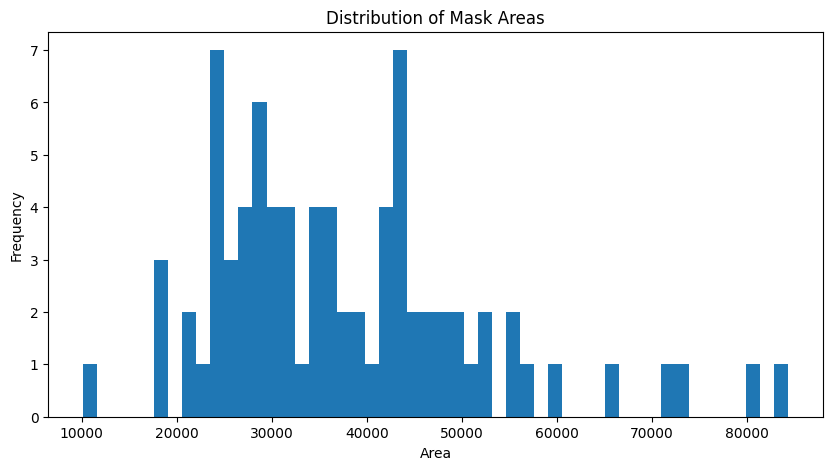

Mean pixel intensity in images: 0.30
Standard deviation of pixel intensities in images: 0.14
Mean mask area: 37803.32
Standard deviation of mask areas: 14221.50


100%|██████████| 20/20 [00:14<00:00,  1.37it/s]


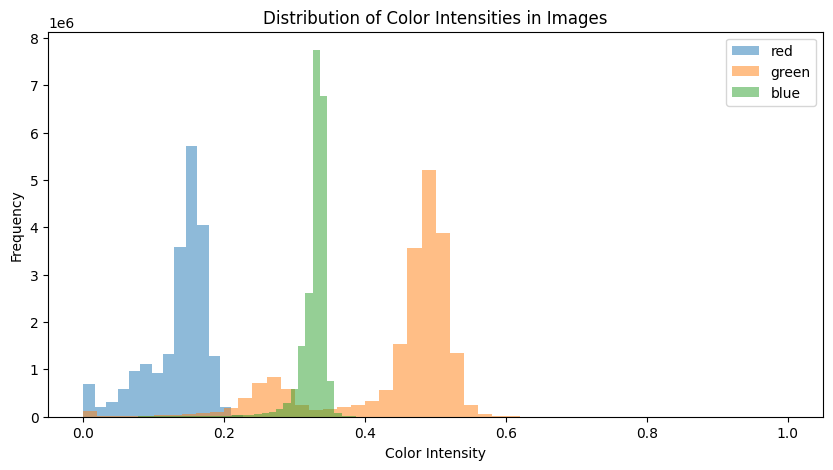

Mean red intensity in images: 0.13
Standard deviation of red intensities in images: 0.04
Mean green intensity in images: 0.44
Standard deviation of green intensities in images: 0.10
Mean blue intensity in images: 0.33
Standard deviation of blue intensities in images: 0.02


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# Number of images to analyze
num_images = 20
num_masks = 20

# For storing statistics
image_pixel_intensities = []
mask_areas = []

for i in tqdm(range(num_images)):
    # Load a batch of images
    images = image_generator.next()

    # Add the pixel intensities to the list
    image_pixel_intensities.extend(images.flatten())

for i in tqdm(range(num_masks)):
    # Load a batch of masks
    masks = mask_generator.next()


    mask_areas.extend((masks > 0).sum(axis=(1, 2, 3)))

# Plot the distribution of pixel intensities in the images
plt.figure(figsize=(10, 5))
plt.hist(image_pixel_intensities, bins=50)
plt.title('Distribution of Pixel Intensities in Images')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 5))
plt.hist(mask_areas, bins=50)
plt.title('Distribution of Mask Areas')
plt.xlabel('Area')
plt.ylabel('Frequency')
plt.show()

# Display mean and std of pixel intensities in the images
print(f'Mean pixel intensity in images: {np.mean(image_pixel_intensities):.2f}')
print(f'Standard deviation of pixel intensities in images: {np.std(image_pixel_intensities):.2f}')

# Display mean and std of mask areas
print(f'Mean mask area: {np.mean(mask_areas):.2f}')
print(f'Standard deviation of mask areas: {np.std(mask_areas):.2f}')


if images.shape[-1] == 3:
    color_intensities = {
        'red': [],
        'green': [],
        'blue': []
    }

    for i in tqdm(range(num_images)):
        # Load a batch of images
        images = image_generator.next()


        color_intensities['red'].extend(images[..., 0].flatten())
        color_intensities['green'].extend(images[..., 1].flatten())
        color_intensities['blue'].extend(images[..., 2].flatten())


    plt.figure(figsize=(10, 5))
    for color in ['red', 'green', 'blue']:
        plt.hist(color_intensities[color], bins=50, alpha=0.5, label=color)
    plt.title('Distribution of Color Intensities in Images')
    plt.xlabel('Color Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

    # Display mean and std of color intensities in the images
    for color in ['red', 'green', 'blue']:
        print(f'Mean {color} intensity in images: {np.mean(color_intensities[color]):.2f}')
        print(f'Standard deviation of {color} intensities in images: {np.std(color_intensities[color]):.2f}')


## **Analysis of Color Channel Correlations and Cell Distributions in Images**

100%|██████████| 20/20 [00:30<00:00,  1.53s/it]


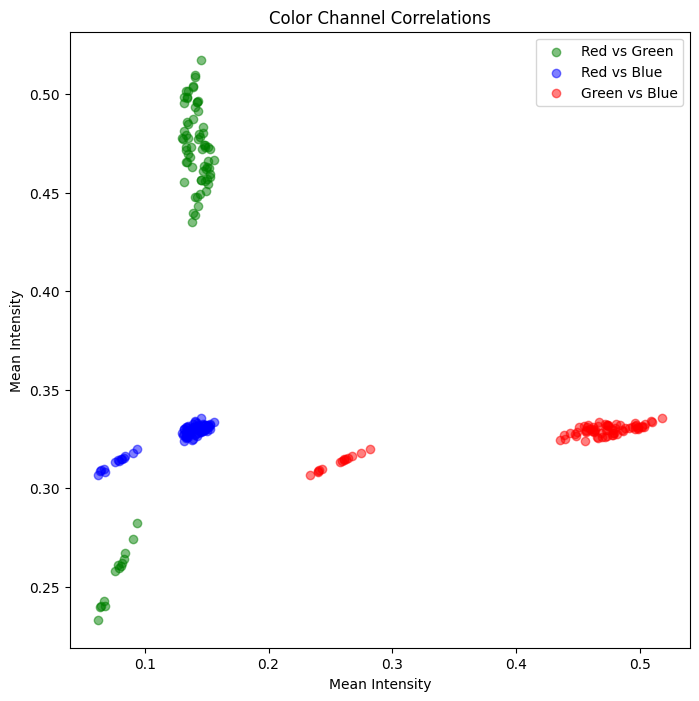

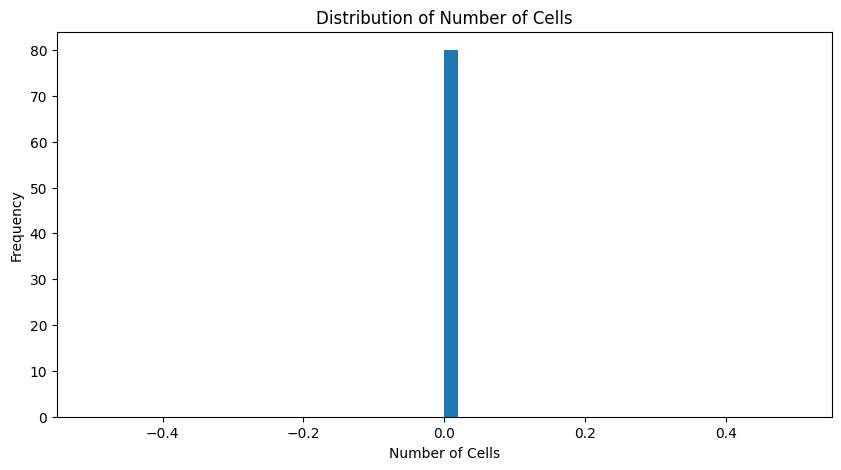

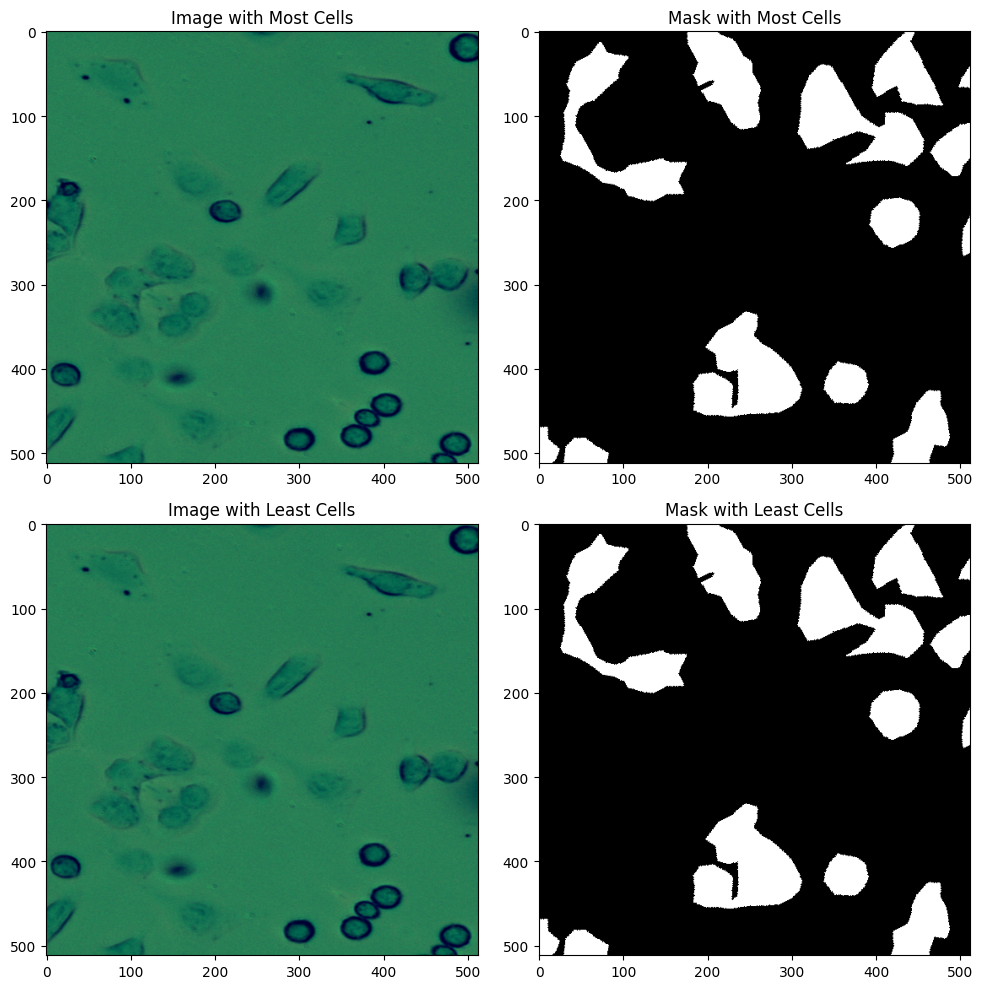

In [ ]:
import cv2
from skimage.measure import label, regionprops


red_intensities = []
green_intensities = []
blue_intensities = []
num_cells = []


for i in tqdm(range(num_images)):
    # Load a batch of images and masks
    images = image_generator.next()
    masks = mask_generator.next()

    for j in range(images.shape[0]):
        image = images[j]
        mask = masks[j]

        if image.shape[-1] == 3:

            red_intensities.append(np.mean(image[..., 0]))
            green_intensities.append(np.mean(image[..., 1]))
            blue_intensities.append(np.mean(image[..., 2]))


        labeled_mask = label(mask)
        num_cells.append(np.max(labeled_mask))


if images.shape[-1] == 3:
    plt.figure(figsize=(8, 8))
    plt.scatter(red_intensities, green_intensities, c='g', alpha=0.5, label='Red vs Green')
    plt.scatter(red_intensities, blue_intensities, c='b', alpha=0.5, label='Red vs Blue')
    plt.scatter(green_intensities, blue_intensities, c='r', alpha=0.5, label='Green vs Blue')
    plt.xlabel('Mean Intensity')
    plt.ylabel('Mean Intensity')
    plt.legend()
    plt.title('Color Channel Correlations')
    plt.show()

# Plot the distribution of the number of cells
plt.figure(figsize=(10, 5))
plt.hist(num_cells, bins=50)
plt.title('Distribution of Number of Cells')
plt.xlabel('Number of Cells')
plt.ylabel('Frequency')
plt.show()

# Display the images with the largest and smallest number of cells
max_cells_idx = np.argmax(num_cells)
min_cells_idx = np.argmin(num_cells)


all_images = image_generator.next()
all_masks = mask_generator.next()

max_cells_image = all_images[max_cells_idx]
max_cells_mask = all_masks[max_cells_idx]

min_cells_image = all_images[min_cells_idx]
min_cells_mask = all_masks[min_cells_idx]

fig, ax = plt.subplots(2, 2, figsize=(10, 10))

ax[0, 0].imshow(max_cells_image)
ax[0, 0].set_title('Image with Most Cells')

ax[0, 1].imshow(max_cells_mask.squeeze(), cmap='gray')
ax[0, 1].set_title('Mask with Most Cells')

ax[1, 0].imshow(min_cells_image)
ax[1, 0].set_title('Image with Least Cells')

ax[1, 1].imshow(min_cells_mask.squeeze(), cmap='gray')
ax[1, 1].set_title('Mask with Least Cells')

plt.tight_layout()
plt.show()


##**Analysis of Cell Morphology: Size and Aspect Ratios**

100%|██████████| 80/80 [00:39<00:00,  2.03it/s]


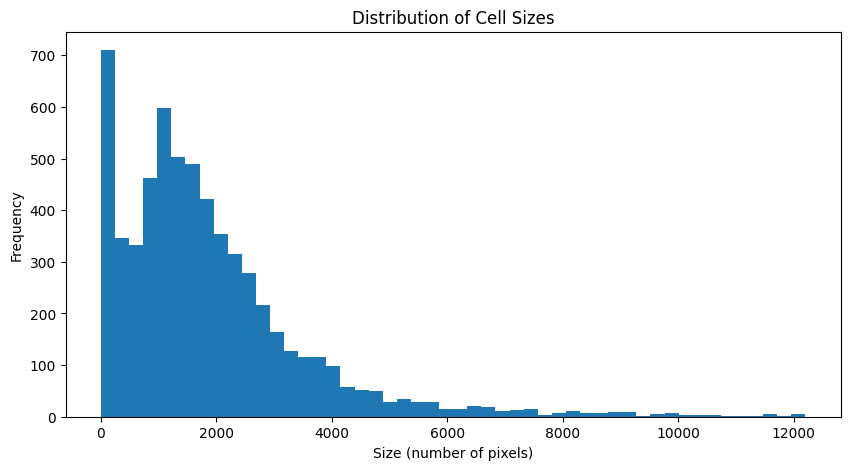

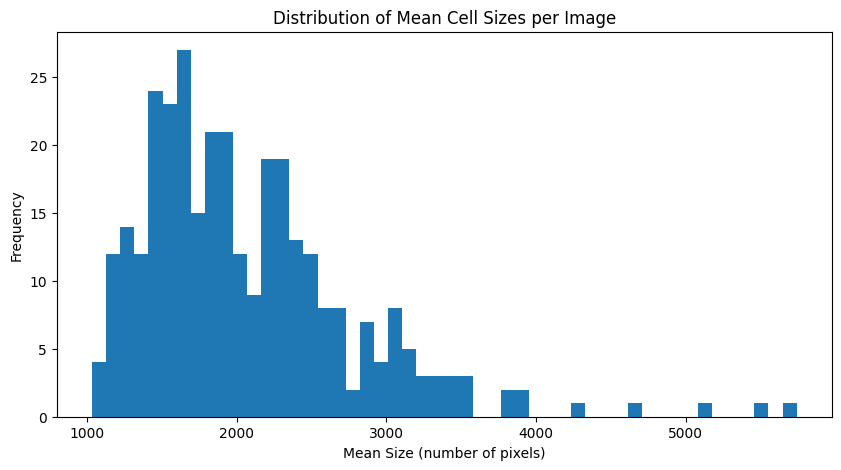

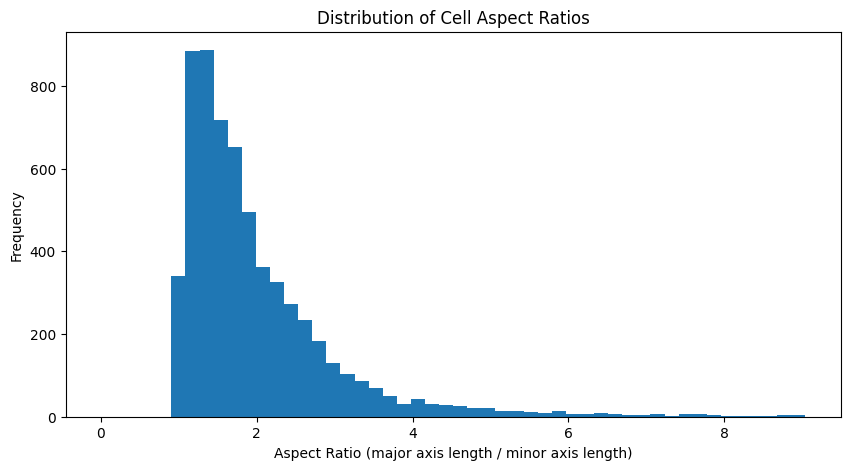

In [ ]:

cell_sizes = []
mean_cell_sizes = []
aspect_ratios = []

# Go through all images
for i in tqdm(range(len(mask_generator))):

    masks = mask_generator.next()

    for j in range(masks.shape[0]):
        mask = masks[j].squeeze()
        labeled_mask = label(mask > 0)
        props = regionprops(labeled_mask)
        sizes = [p.area for p in props]
        ratios = [p.major_axis_length / p.minor_axis_length if p.minor_axis_length > 0 else 1 for p in props]


        cell_sizes.extend(sizes)
        mean_cell_sizes.append(np.mean(sizes) if sizes else 0)
        aspect_ratios.extend(ratios)

# Plot the distribution of cell sizes
plt.figure(figsize=(10, 5))
plt.hist(cell_sizes, bins=50, range=(0, np.percentile(cell_sizes, 99.5)))  # Ignore the largest 0.5% of cells for better visualization
plt.title('Distribution of Cell Sizes')
plt.xlabel('Size (number of pixels)')
plt.ylabel('Frequency')
plt.show()

# Plot the distribution of mean cell sizes per image
plt.figure(figsize=(10, 5))
plt.hist(mean_cell_sizes, bins=50)
plt.title('Distribution of Mean Cell Sizes per Image')
plt.xlabel('Mean Size (number of pixels)')
plt.ylabel('Frequency')
plt.show()

# Plot the distribution of cell aspect ratios
plt.figure(figsize=(10, 5))
plt.hist(aspect_ratios, bins=50, range=(0, np.percentile(aspect_ratios, 99.5)))
plt.title('Distribution of Cell Aspect Ratios')
plt.xlabel('Aspect Ratio (major axis length / minor axis length)')
plt.ylabel('Frequency')
plt.show()


### **Summary Analysis of Image Intensities and Unique Colors in Masks**

In [ ]:
import numpy as np

# Number of images to sample for analysis
sample_size = 100


mean_intensities = []
stddev_intensities = []
unique_colors = []

# Sample images
for i in range(sample_size):
    image = image_generator.next()[0]
    mask = mask_generator.next()[0]
    mean_intensities.append(np.mean(image))
    stddev_intensities.append(np.std(image))

    # Count and store number of unique colors/gray levels
    unique_colors.append(len(np.unique(mask)))

# Print summary statistics
print(f'Mean of mean intensities: {np.mean(mean_intensities)}')
print(f'Standard deviation of mean intensities: {np.std(mean_intensities)}')
print(f'Mean of stddev of intensities: {np.mean(stddev_intensities)}')
print(f'Standard deviation of stddev of intensities: {np.std(stddev_intensities)}')
print(f'Average number of unique colors/gray levels in masks: {np.mean(unique_colors)}')


Mean of mean intensities: 0.3071627914905548
Standard deviation of mean intensities: 0.02874683029949665
Mean of stddev of intensities: 0.14039911329746246
Standard deviation of stddev of intensities: 0.013506393879652023
Average number of unique colors/gray levels in masks: 2.0


### **Defination For Result Function**

In [ ]:
def greytobinary(originalImage):


    im_gray = originalImage
    thresh = 0
    blackAndWhiteImage = cv2.threshold(im_gray, thresh, 1, cv2.THRESH_BINARY)[1]


    return blackAndWhiteImage

def Metrics_2(Y_pred,Y_val):
    import seaborn as sns

    FP = len(np.where(Y_pred - Y_val == -1)[0])
    FN = len(np.where(Y_pred - Y_val == 1)[0])
    TP = len(np.where(Y_pred + Y_val == 2)[0])
    TN = len(np.where(Y_pred + Y_val == 0)[0])

    Recall = TP/(TP+FN)
    Precision = TP/(TP+FP)
    Accuracy = (TP+TN)/(TP+FN+TN+FP)
    F1 = 2 * (Precision * Recall)/(Precision + Recall)
    IoU =  TP/(TP+FP+FN)
    DICE = (2 * TP) / (2 * TP+FP+FN)
    return Recall,Precision,Accuracy,F1,IoU, TP, TN, FP, FN,DICE

### **Function for Calculating Results for each model**

In [ ]:
import sklearn
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import os
import cv2
from statistics import mean


def evaluation_metrics(model, t, m):
  data = []
  for img in range(0, t.shape[0]):
      temp_img = t[img]
      ground_truth = m[img]
      temp_img_input = np.expand_dims(temp_img, 0)
      prediction = (model.predict(temp_img_input)[0,:,:,0] > 0.55).astype(np.uint8)

      Y_pred = prediction
      Y_val = greytobinary(ground_truth)
      Y_val = np.reshape(Y_val,(512,512))
      Y_val = Y_val.astype(int)

      Y_pred = 1 - Y_pred
      Y_val = 1 - Y_val

      Recall, Precision, Accuracy, F1, IoU, TP, TN, FP, FN, DICE = Metrics_2(Y_pred, Y_val)

      keys = ['Recall', 'Precision', 'Accuracy', 'F1','IoU', 'TP', 'TN', 'FP', 'FN', 'DICE']
      values = [Recall, Precision, Accuracy, F1, IoU, TP, TN, FP, FN, DICE]

      zipped = zip(keys, values)
      dic = dict(zipped)
      data.append(dic)

  # Convert the list of dictionaries to a DataFrame after the loop
  total_result = pd.DataFrame(data)
  print("\nMean of Recall is: %f\nMean of Precision is: %f"%(mean(total_result['Recall']),mean(total_result['Precision'])))
  print("Mean of Accuracy is: %f\nMean of F1 is: %f\n"%(mean(total_result['Accuracy']),mean(total_result['F1'])))
  print("\nMean of IoU is: %f"%(mean(total_result['IoU'])))
  print("\nMean of DICE is: %f"%(mean(total_result['DICE'])))

## Simple Unet Model

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate

def unet_model(input_size=(512, 512, 3)):
    inputs = Input(input_size)

    #Downsampling
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D((2, 2))(conv2)

    #Bridge
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)

    #Upsampling
    up4 = concatenate([UpSampling2D((2, 2))(conv3), conv2], axis=-1)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(up4)

    up5 = concatenate([UpSampling2D((2, 2))(conv4), conv1], axis=-1)
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(up5)

    #Final layer
    output = Conv2D(1, (1, 1), activation='sigmoid')(conv5)

    return Model(inputs=inputs, outputs=output)

# Instantiate and compile the model
model = unet_model()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
import os
num_train_samples = sum([len(files) for r, d, files in os.walk("/content/drive/MyDrive/Dataset/spilit_x_image_train/")])
num_valid_samples = sum([len(files) for r, d, files in os.walk("/content/drive/MyDrive/Dataset/spilit_x_image_validate/")])

print('num_train_samples', num_train_samples)
print('num_valid_samples', num_valid_samples)
print('batch_size', batch_size)

train_steps = np.ceil(num_train_samples / batch_size)
valid_steps = np.ceil(num_valid_samples / batch_size)

history = model.fit(
    training_set_generator,
    epochs=50,
    steps_per_epoch=train_steps,
    validation_data=validation_set_generator,
    validation_steps=valid_steps
)

num_train_samples 321
num_valid_samples 81
batch_size 4
Epoch 1/50
81/81 [==============================] - 197s 2s/step - loss: 0.0318 - accuracy: 0.8448 - val_loss: 0.0047 - val_accuracy: 0.8565
Epoch 2/50
81/81 [==============================] - 59s 738ms/step - loss: 0.0046 - accuracy: 0.8538 - val_loss: 0.0044 - val_accuracy: 0.8598
Epoch 3/50
81/81 [==============================] - 58s 725ms/step - loss: 0.0044 - accuracy: 0.8541 - val_loss: 0.0043 - val_accuracy: 0.8581
Epoch 4/50
81/81 [==============================] - 58s 717ms/step - loss: 0.0044 - accuracy: 0.8557 - val_loss: 0.0045 - val_accuracy: 0.8547
Epoch 5/50
81/81 [==============================] - 58s 724ms/step - loss: 0.0044 - accuracy: 0.8547 - val_loss: 0.0043 - val_accuracy: 0.8567
Epoch 6/50
81/81 [==============================] - 58s 720ms/step - loss: 0.0043 - accuracy: 0.8558 - val_loss: 0.0042 - val_accuracy: 0.8625
Epoch 7/50
81/81 [==============================] - 58s 724ms/step - loss: 0.0043 - accu

### **Save the model**

In [ ]:
model.save('/content/drive/MyDrive/Dataset/trained_model.h5')

print("Model saved successfully.")

Model saved successfully.


### **Load the Model**

In [ ]:
from tensorflow import keras

saved_model_path = "/content/drive/MyDrive/Dataset/trained_model.h5"

# Load the model
loaded_model = keras.models.load_model(saved_model_path)

# Print model summary to check if it is loaded correctly
loaded_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 max_pooling2d (MaxPooling2D)   (None, 256, 256, 64  0           ['conv2d[0][0]']                 
                                )                                                             

### **Testing the Model**

In [ ]:
test_img_data_generator = ImageDataGenerator(**img_gen_args)
test_img_generator = test_img_data_generator.flow_from_directory(
    "/content/drive/MyDrive/Dataset/spilit_x_image_test/",
    seed=seed,
    batch_size=batch_size,
    target_size=(512, 512),
    class_mode=None
)


test_mask_data_generator = ImageDataGenerator(**mask_gen_args)
test_mask_generator = test_mask_data_generator.flow_from_directory(
    "/content/drive/MyDrive/Dataset/spilit_y_mask_test/",
    seed=seed,
    batch_size=batch_size,
    target_size=(512, 512),
    color_mode='grayscale',  # Read masks in grayscale
    class_mode=None
)

# Generating predictions on test data
test_set_generator = zip(test_img_generator, test_mask_generator)

predictions = model.predict(test_set_generator, steps=len(test_img_generator))


Found 100 images belonging to 1 classes.
Found 100 images belonging to 1 classes.
25/25 [==============================] - 34s 1s/step


### **Calculating Accuracy of model**






In [ ]:
from sklearn.metrics import accuracy_score


threshold = 0.5

# Processing predictions and ground truth masks
y_true = []
y_pred = []

for i in range(len(test_img_generator)):
    images, masks = next(test_set_generator)


    predicted_masks = (loaded_model.predict(images) > threshold).astype(int)

    # Convert grayscale masks to binary masks (0 or 1)
    masks = (masks > 0).astype(int)

    y_true.extend(masks.flatten())
    y_pred.extend(predicted_masks.flatten())

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred)

print("Accuracy:", accuracy)


1/1 [==============================] - 0s 25ms/step
Accuracy: 0.8531769180297851


### **Random Visualization of Six Predicted Masks**

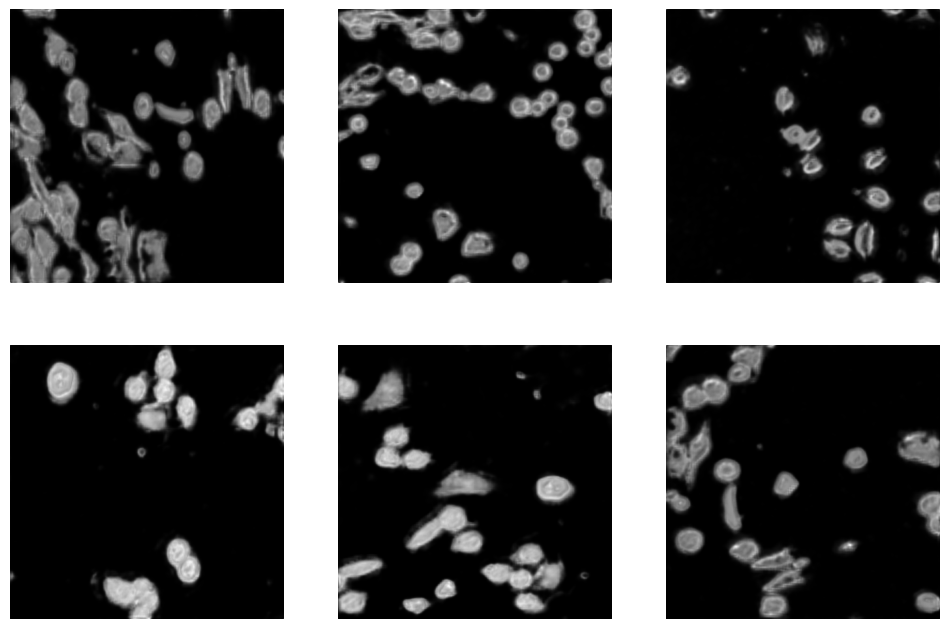

In [ ]:
import numpy as np
import matplotlib.pyplot as plt



# Convert y_pred to a NumPy array
y_pred_array = np.array(predictions)

# Function to display 6 images in a 2x3 grid
def display_images(images):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i].squeeze(), cmap='gray')
        ax.axis('off')
    plt.show()

# Randomly select 6 images from the array
random_indices = np.random.choice(len(y_pred_array), size=6, replace=False)
selected_images = y_pred_array[random_indices]

# Display the selected images
display_images(selected_images)


### **Comparison of True and Predicted Masks for a Sample Test Image**

1/1 [==============================] - 0s 30ms/step


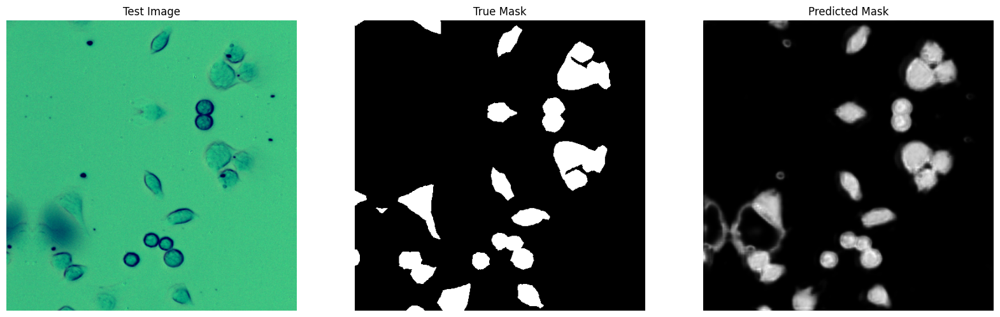

In [ ]:
# Getting a batch of images and masks from the test set
test_images, test_labels = next(test_set_generator)

# Predicting on a batch of images
predicted_labels = loaded_model.predict(test_images)

# Selecting the first image and mask from the batch
test_image = test_images[0]
test_label = test_labels[0, ..., 0]
predicted_label = predicted_labels[0, ..., 0]

# Normalizing the images for display
test_image = (test_image - test_image.min()) / (test_image.max() - test_image.min())
test_label = (test_label - test_label.min()) / (test_label.max() - test_label.min())
predicted_label = (predicted_label - predicted_label.min()) / (predicted_label.max() - predicted_label.min())

# Plotting the test image, true mask, and predicted mask
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

axs[0].imshow(test_image)
axs[0].set_title('Test Image')

axs[1].imshow(test_label, cmap='gray')
axs[1].set_title('True Mask')

axs[2].imshow(predicted_label, cmap='gray')
axs[2].set_title('Predicted Mask')

for ax in axs:
    ax.axis('off')

plt.show()


### **Result For Simple UNet**

In [ ]:
t = test_img_generator.next()
m = test_mask_generator.next()

evaluation_metrics(loaded_model,t,m)

1/1 [==============================] - 0s 25ms/step

Mean of Recall is: 0.870126
Mean of Precision is: 1.000000
Mean of Accuracy is: 0.870126
Mean of F1 is: 0.930460


Mean of IoU is: 0.870126

Mean of DICE is: 0.930460


### **Displaying the Results in Graphical View**

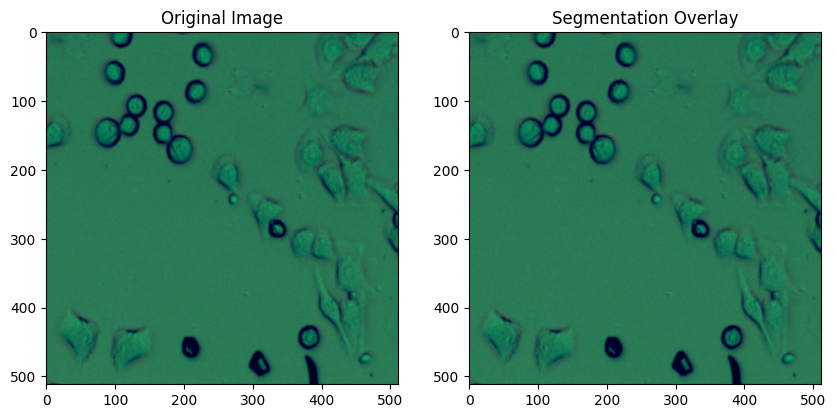

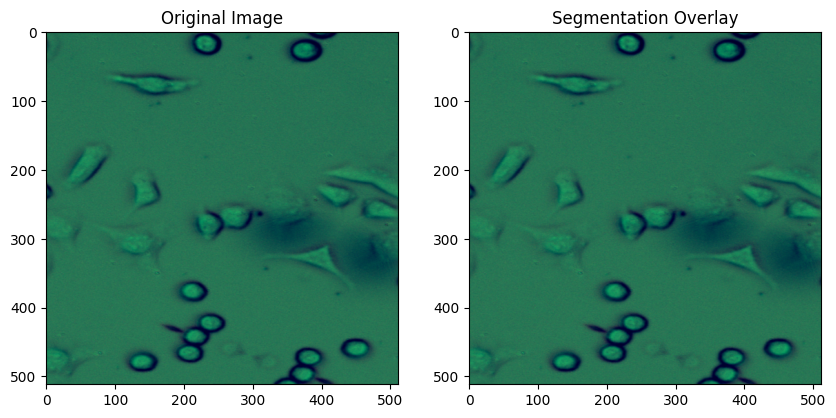

In [ ]:
alpha = 0.5
for idx, (imgs, masks) in enumerate(test_set_generator):
    if idx == 2:
        break

    predicted_mask = predictions[idx].squeeze() > 0.5
    original_img = (imgs[0] * 255).astype(np.uint8)

    overlay = original_img.copy()
    overlay[predicted_mask] = [255, 0, 0]

    output = cv2.addWeighted(original_img, alpha, overlay, 1 - alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(output)
    plt.title("Segmentation Overlay")

    plt.show()

### **Visualization of Predicted Probabilities as Heatmaps for Selected Batches**

25/25 [==============================] - 13s 547ms/step


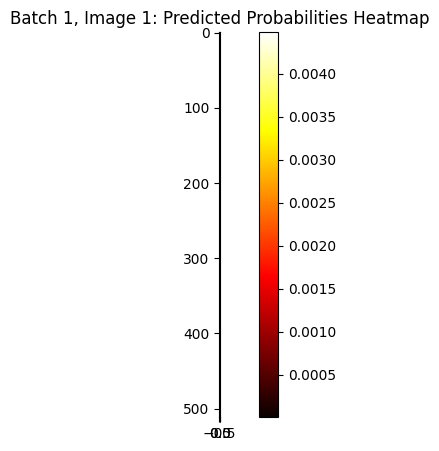

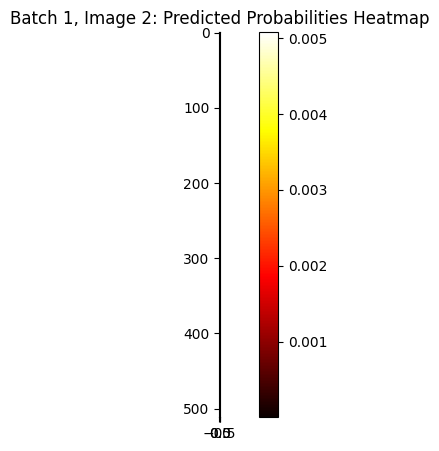

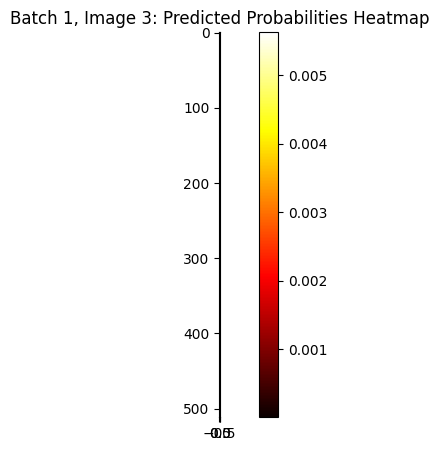

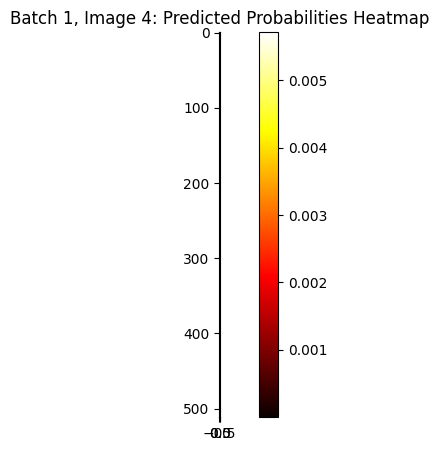

In [ ]:
test_set_generator = zip(test_img_generator, test_mask_generator)
predictions = loaded_model.predict(test_set_generator, steps=len(test_img_generator))

# Number of batches to visualize. Set to 1 if you just want to visualize one batch.
num_batches_to_visualize = 1

for batch_idx in range(num_batches_to_visualize):
    imgs = test_img_generator[batch_idx]
    true_masks = test_mask_generator[batch_idx]
    predicted_masks_batch = (predictions[batch_idx] > 0.5).astype(np.uint8)
    predicted_probabilities_batch = predictions[batch_idx]  # Direct probabilities

    for i in range(imgs.shape[0]):  # Looping through each image in the batch
        predicted_probability = predicted_probabilities_batch[i]

        if predicted_probability.ndim > 2:
            predicted_probability = predicted_probability.squeeze(-1)

        plt.figure(figsize=(10, 5))

        plt.imshow(predicted_probability, cmap='hot', interpolation='nearest')
        plt.colorbar()
        plt.title(f"Batch {batch_idx+1}, Image {i+1}: Predicted Probabilities Heatmap")
        plt.show()

## **Soft Attention UNet model**

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Activation, multiply
from tensorflow.keras.models import Model

# Soft Attention U-Net model
def soft_attention_unet(input_shape, num_classes=1):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)

    # Soft Attention Block
    sa_block = Conv2D(1, 1, activation='sigmoid', padding='same', kernel_initializer='he_normal')(conv4)
    multiplied = multiply([conv4, sa_block])

    # Decoder
    up5 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(multiplied)
    up5 = concatenate([up5, conv3], axis=3)
    conv5 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up5)
    conv5 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)

    up6 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv5)
    up6 = concatenate([up6, conv2], axis=3)
    conv6 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up6)
    conv6 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)

    up7 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv6)
    up7 = concatenate([up7, conv1], axis=3)
    conv7 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up7)
    conv7 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

    outputs = Conv2D(num_classes, 1, activation='sigmoid')(conv7)

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Creating the Soft Attention U-Net model
input_shape = (512, 512, 3)
soft_attention_unet_model = soft_attention_unet(input_shape)


soft_attention_unet_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Printing the model summary
soft_attention_unet_model.summary()
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Activation, multiply
from tensorflow.keras.models import Model

# Soft Attention U-Net model
def soft_attention_unet(input_shape, num_classes=1):
    inputs = Input(input_shape)

    # Encoder
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4)

    # Soft Attention Block
    sa_block = Conv2D(1, 1, activation='sigmoid', padding='same', kernel_initializer='he_normal')(conv4)
    multiplied = multiply([conv4, sa_block])

    # Decoder
    up5 = Conv2DTranspose(256, 2, strides=(2, 2), padding='same')(multiplied)
    up5 = concatenate([up5, conv3], axis=3)
    conv5 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up5)
    conv5 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv5)

    up6 = Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv5)
    up6 = concatenate([up6, conv2], axis=3)
    conv6 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up6)
    conv6 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv6)

    up7 = Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv6)
    up7 = concatenate([up7, conv1], axis=3)
    conv7 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(up7)
    conv7 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv7)

    outputs = Conv2D(num_classes, 1, activation='sigmoid')(conv7)

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Create the Soft Attention U-Net model
input_shape = (512, 512, 3)
soft_attention_unet_model = soft_attention_unet(input_shape)


soft_attention_unet_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Printing the model summary
soft_attention_unet_model.summary()


Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 512, 512, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_7 (Conv2D)              (None, 512, 512, 64  36928       ['conv2d_6[0][0]']               
                                )                                                           

### **Training a Soft Attention U-Net Model on Segmentation Data**

In [ ]:

num_epochs = 50

# Fiting the model
history = soft_attention_unet_model.fit(
    training_set_generator,
    steps_per_epoch=len(image_generator),
    epochs=num_epochs,
    validation_data=validation_set_generator,
    validation_steps=len(valid_img_generator)
)


Epoch 1/50
80/80 [==============================] - 97s 855ms/step - loss: 0.0126 - accuracy: 0.8559 - val_loss: 0.0046 - val_accuracy: 0.8574
Epoch 2/50
80/80 [==============================] - 67s 844ms/step - loss: 0.0045 - accuracy: 0.8549 - val_loss: 0.0044 - val_accuracy: 0.8561
Epoch 3/50
80/80 [==============================] - 67s 844ms/step - loss: 0.0043 - accuracy: 0.8565 - val_loss: 0.0042 - val_accuracy: 0.8586
Epoch 4/50
80/80 [==============================] - 68s 848ms/step - loss: 0.0043 - accuracy: 0.8544 - val_loss: 0.0042 - val_accuracy: 0.8584
Epoch 5/50
80/80 [==============================] - 67s 842ms/step - loss: 0.0041 - accuracy: 0.8582 - val_loss: 0.0041 - val_accuracy: 0.8571
Epoch 6/50
80/80 [==============================] - 67s 845ms/step - loss: 0.0044 - accuracy: 0.8510 - val_loss: 0.0043 - val_accuracy: 0.8558
Epoch 7/50
80/80 [==============================] - 68s 847ms/step - loss: 0.0041 - accuracy: 0.8575 - val_loss: 0.0041 - val_accuracy: 0.8604

### **Save The model**

In [ ]:
# Saving the model to Google Drive
model_save_path = '/content/drive/MyDrive/Dataset/trained_model_soft_attention.h5'
soft_attention_unet_model.save(model_save_path)


### **Load the model**

In [ ]:


from tensorflow import keras


saved_model_path = "/content/drive/MyDrive/Dataset/trained_model_soft_attention.h5"

# Load the model
loaded_model = keras.models.load_model(saved_model_path)

# Print model summary to check if it is loaded correctly
loaded_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_28 (Conv2D)             (None, 512, 512, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_29 (Conv2D)             (None, 512, 512, 64  36928       ['conv2d_28[0][0]']              
                                )                                                           

### **Generating Predictions on Test Data using Soft Attention U-Net Model**

In [ ]:
test_img_data_generator = ImageDataGenerator(**img_gen_args)
test_img_generator = test_img_data_generator.flow_from_directory(
    "/content/drive/MyDrive/Dataset/spilit_x_image_test/",
    seed=seed,
    batch_size=batch_size,
    target_size=(512, 512),
    class_mode=None
)


test_mask_data_generator = ImageDataGenerator(**mask_gen_args)
test_mask_generator = test_mask_data_generator.flow_from_directory(
    "/content/drive/MyDrive/Dataset/spilit_y_mask_test/",
    seed=seed,
    batch_size=batch_size,
    target_size=(512, 512),
    color_mode='grayscale',  # Read masks in grayscale
    class_mode=None
)

# Generating predictions on test data
test_set_generator = zip(test_img_generator, test_mask_generator)

predictions = soft_attention_unet_model.predict(test_set_generator, steps=len(test_img_generator))


Found 100 images belonging to 1 classes.
Found 100 images belonging to 1 classes.
25/25 [==============================] - 14s 558ms/step


### **Calculating Accuracy of model**

In [ ]:
from sklearn.metrics import accuracy_score


threshold = 0.5

# Processing predictions and ground truth masks
y_true = []
y_pred = []

for i in range(len(test_img_generator)):
    images, masks = next(test_set_generator)


    predicted_masks = (soft_attention_unet_model.predict(images) > threshold).astype(int)

    # Convert grayscale masks to binary masks (0 or 1)
    masks = (masks > 0).astype(int)

    y_true.extend(masks.flatten())
    y_pred.extend(predicted_masks.flatten())

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred)

print("Accuracy:", accuracy)


1/1 [==============================] - 0s 35ms/step
Accuracy: 0.8518957138061524


### **Random Visualization of Six Predicted Masks**

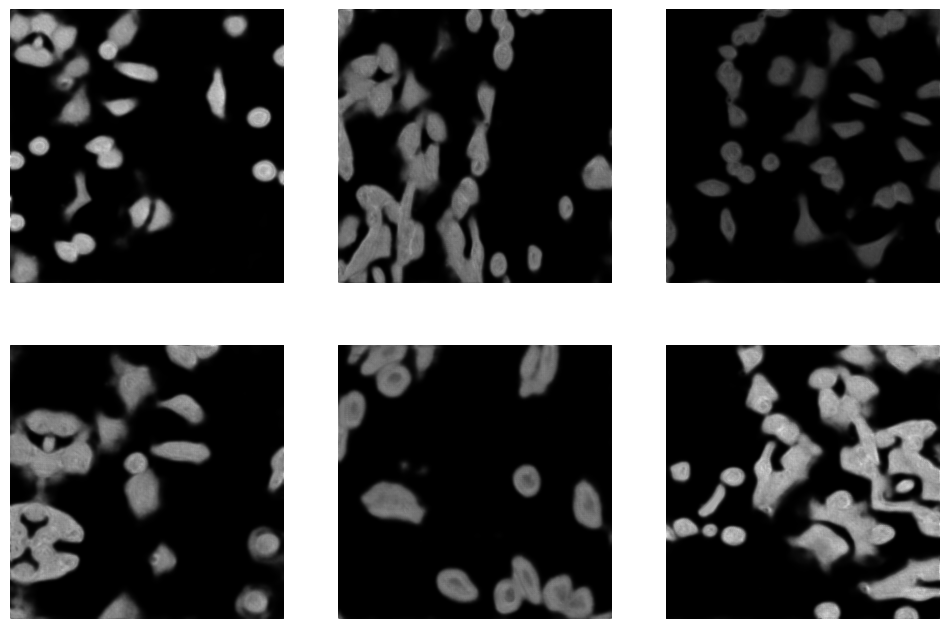

In [ ]:
import numpy as np
import matplotlib.pyplot as plt



# Convert y_pred to a NumPy array
y_pred_array = np.array(predictions)

# Function to display 6 images in a 2x3 grid
def display_images(images):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i].squeeze(), cmap='gray')
        ax.axis('off')
    plt.show()

# Randomly select 6 images from the array
random_indices = np.random.choice(len(y_pred_array), size=6, replace=False)
selected_images = y_pred_array[random_indices]

# Display the selected images
display_images(selected_images)

### **Comparison of True and Predicted Masks for a Sample Test Image**

1/1 [==============================] - 0s 28ms/step


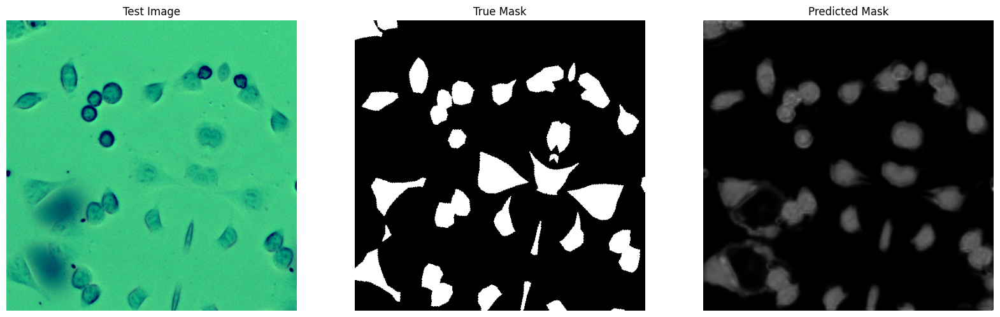

In [ ]:
# Getting a batch of images and masks from the test set
test_images, test_labels = next(test_set_generator)

# Predicting on a batch of images
predicted_labels = loaded_model.predict(test_images)

# Selecting the first image and mask from the batch
test_image = test_images[0]
test_label = test_labels[0, ..., 0]
predicted_label = predicted_labels[0, ..., 0]

# Normalizing the images for display
test_image = (test_image - test_image.min()) / (test_image.max() - test_image.min())
test_label = (test_label - test_label.min()) / (test_label.max() - test_label.min())
predicted_label = (predicted_label - predicted_label.min()) / (predicted_label.max() - predicted_label.min())

# Plotting the test image, true mask, and predicted mask
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

axs[0].imshow(test_image)
axs[0].set_title('Test Image')

axs[1].imshow(test_label, cmap='gray')
axs[1].set_title('True Mask')

axs[2].imshow(predicted_label, cmap='gray')
axs[2].set_title('Predicted Mask')

for ax in axs:
    ax.axis('off')

plt.show()


### **Results for Soft Attention**

In [ ]:
t = test_img_generator.next()
m = test_mask_generator.next()

evaluation_metrics(loaded_model,t,m)

1/1 [==============================] - 0s 21ms/step

Mean of Recall is: 0.897323
Mean of Precision is: 1.000000
Mean of Accuracy is: 0.897323
Mean of F1 is: 0.945804


Mean of IoU is: 0.897323

Mean of DICE is: 0.945804


### **Displaying the Results in Graphical View**

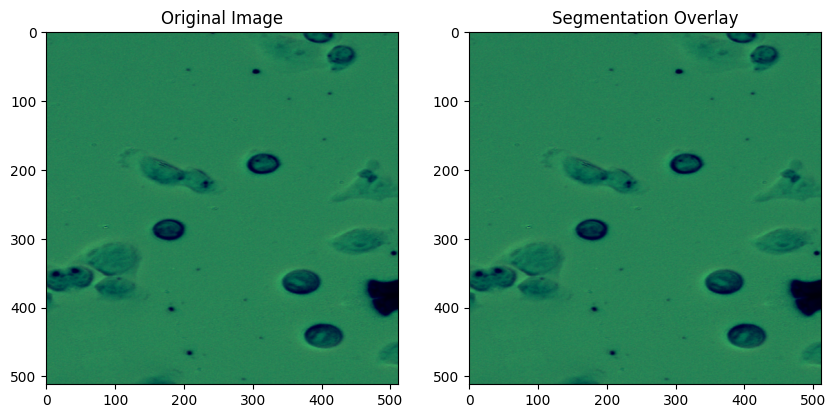

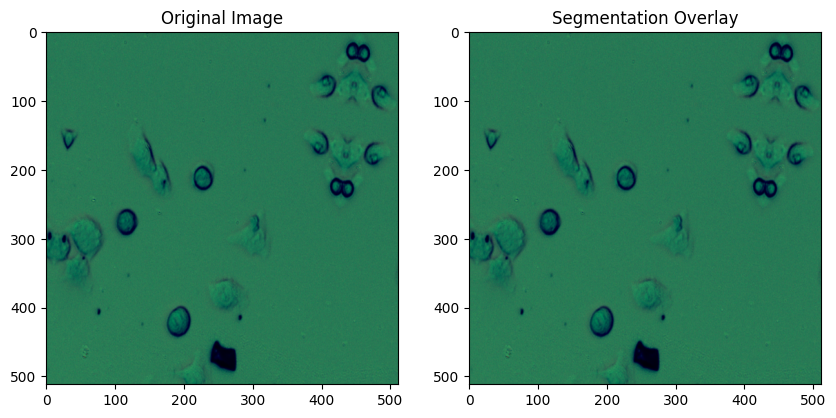

In [ ]:
alpha = 0.5
for idx, (imgs, masks) in enumerate(test_set_generator):
    if idx == 2:
        break

    predicted_mask = predictions[idx].squeeze() > 0.5
    original_img = (imgs[0] * 255).astype(np.uint8)

    overlay = original_img.copy()
    overlay[predicted_mask] = [255, 0, 0]

    output = cv2.addWeighted(original_img, alpha, overlay, 1 - alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(output)
    plt.title("Segmentation Overlay")

    plt.show()

### **Visualization of Predicted Probabilities as Heatmaps for Selected Batches**

25/25 [==============================] - 13s 545ms/step


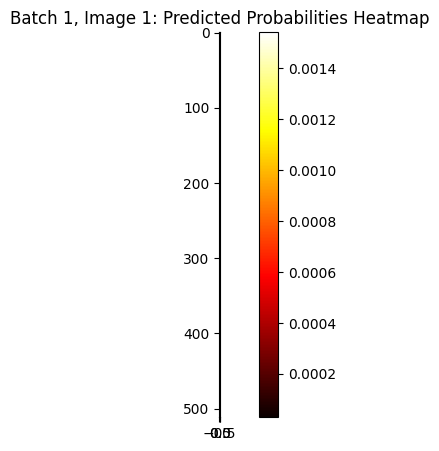

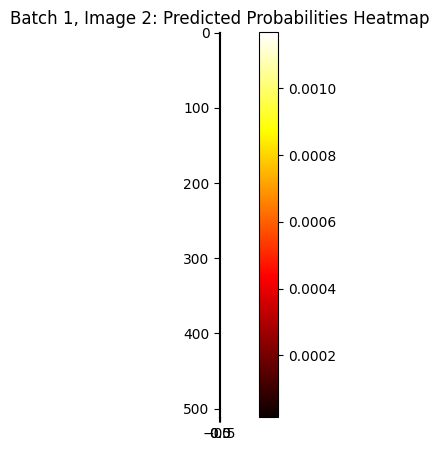

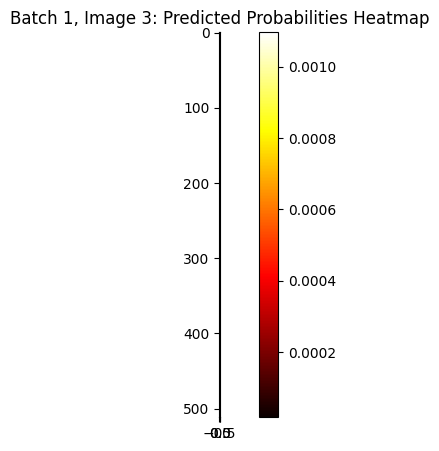

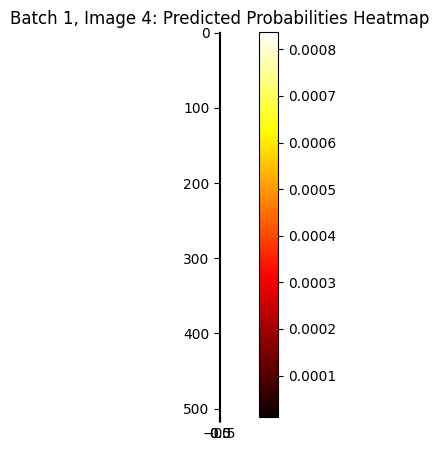

In [ ]:
test_set_generator = zip(test_img_generator, test_mask_generator)
predictions = loaded_model.predict(test_set_generator, steps=len(test_img_generator))

# Number of batches to visualize.
num_batches_to_visualize = 1

for batch_idx in range(num_batches_to_visualize):
    imgs = test_img_generator[batch_idx]
    true_masks = test_mask_generator[batch_idx]
    predicted_masks_batch = (predictions[batch_idx] > 0.5).astype(np.uint8)
    predicted_probabilities_batch = predictions[batch_idx]  # Direct probabilities

    for i in range(imgs.shape[0]):  # Looping through each image in the batch
        predicted_probability = predicted_probabilities_batch[i]

        if predicted_probability.ndim > 2:
            predicted_probability = predicted_probability.squeeze(-1)

        plt.figure(figsize=(10, 5))

        plt.imshow(predicted_probability, cmap='hot', interpolation='nearest')
        plt.colorbar()
        plt.title(f"Batch {batch_idx+1}, Image {i+1}: Predicted Probabilities Heatmap")
        plt.show()

###**Residual attention Unet**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Activation, add

def attention_block(x, gating, inter_shape):
    theta_x = Conv2D(inter_shape, (2, 2), strides=(2, 2), padding='same')(x)
    phi_g = Conv2D(inter_shape, (1, 1), padding='same')(gating)
    f = Activation('relu')(add([theta_x, phi_g]))
    psi_f = Conv2D(1, (1, 1), padding='same')(f)
    rate = Activation('sigmoid')(psi_f)
    rate_expanded = tf.image.resize(rate, (x.shape[1], x.shape[2]))
    att_x = tf.multiply(rate_expanded, x)
    return att_x

def conv_block(inputs, num_filters, kernel_size=3, activation='relu', padding='same', strides=1):
    x = Conv2D(num_filters, kernel_size, padding=padding, strides=strides)(inputs)
    x = BatchNormalization()(x)
    x = Activation(activation)(x)
    return x

def residual_block(inputs, num_filters, kernel_size=3, activation='relu', padding='same', strides=1):
    x = conv_block(inputs, num_filters, kernel_size, activation, padding, strides)
    x = conv_block(x, num_filters, kernel_size, activation, padding)
    residual = Conv2D(num_filters, kernel_size, padding=padding, strides=strides)(inputs)
    x = add([x, residual])
    return x

def attention_unet(input_shape=(512, 512, 3), num_classes=1, initial_filters=64):
    inputs = Input(input_shape)

    # Encoder
    encoder1 = residual_block(inputs, initial_filters)
    pool1 = MaxPooling2D(pool_size=(2, 2))(encoder1)

    encoder2 = residual_block(pool1, initial_filters * 2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(encoder2)

    encoder3 = residual_block(pool2, initial_filters * 4)
    pool3 = MaxPooling2D(pool_size=(2, 2))(encoder3)

    encoder4 = residual_block(pool3, initial_filters * 8)
    pool4 = MaxPooling2D(pool_size=(2, 2))(encoder4)

    # Bridge
    bridge = residual_block(pool4, initial_filters * 16)

    # Attention Block
    att = attention_block(encoder4, bridge, initial_filters * 16)

    # Decoder
    upconv4 = UpSampling2D(size=(2, 2))(bridge)
    upconv4 = conv_block(upconv4, initial_filters * 8)

    concat4 = concatenate([att, upconv4])
    decoder4 = residual_block(concat4, initial_filters * 8)

    upconv3 = UpSampling2D(size=(2, 2))(decoder4)
    upconv3 = conv_block(upconv3, initial_filters * 4)

    concat3 = concatenate([encoder3, upconv3])
    decoder3 = residual_block(concat3, initial_filters * 4)

    upconv2 = UpSampling2D(size=(2, 2))(decoder3)
    upconv2 = conv_block(upconv2, initial_filters * 2)

    concat2 = concatenate([encoder2, upconv2])
    decoder2 = residual_block(concat2, initial_filters * 2)

    upconv1 = UpSampling2D(size=(2, 2))(decoder2)
    upconv1 = conv_block(upconv1, initial_filters)

    concat1 = concatenate([encoder1, upconv1])
    decoder1 = residual_block(concat1, initial_filters)

    # Output
    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid')(decoder1)

    # Create model
    model = Model(inputs=inputs, outputs=outputs)

    return model

# Creating the Residual Attention U-Net model
residual_attention_unet_model = attention_unet(input_shape=(512, 512, 3), num_classes=1, initial_filters=64)


residual_attention_unet_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:


# Define the number of training and validation steps per epoch
num_train_steps = len(image_generator)
num_valid_steps = len(valid_img_generator)

# Define the number of epochs
num_epochs = 20

# Fit the model to the data
history = residual_attention_unet_model.fit(
    training_set_generator,
    steps_per_epoch=num_train_steps,
    validation_data=validation_set_generator,
    validation_steps=num_valid_steps,
    epochs=num_epochs
)




Epoch 1/20
80/80 [==============================] - 469s 5s/step - loss: 0.0189 - accuracy: 0.8489 - val_loss: 0.0173 - val_accuracy: 0.8569
Epoch 2/20
80/80 [==============================] - 148s 2s/step - loss: 0.0043 - accuracy: 0.8543 - val_loss: 0.0190 - val_accuracy: 0.8658
Epoch 3/20
80/80 [==============================] - 155s 2s/step - loss: 0.0042 - accuracy: 0.8533 - val_loss: 0.0110 - val_accuracy: 0.8549
Epoch 4/20
80/80 [==============================] - 158s 2s/step - loss: 0.0040 - accuracy: 0.8559 - val_loss: 0.0094 - val_accuracy: 0.8590
Epoch 5/20
80/80 [==============================] - 158s 2s/step - loss: 0.0040 - accuracy: 0.8559 - val_loss: 0.0048 - val_accuracy: 0.8574
Epoch 6/20
80/80 [==============================] - 157s 2s/step - loss: 0.0041 - accuracy: 0.8538 - val_loss: 0.0042 - val_accuracy: 0.8595
Epoch 7/20
80/80 [==============================] - 158s 2s/step - loss: 0.0039 - accuracy: 0.8593 - val_loss: 0.0047 - val_accuracy: 0.8507
Epoch 8/20
80

### **Save The Model**

In [ ]:
# Save the model to Google Drive
model_save_path = '/content/drive/MyDrive/Dataset/residual_attention_unet_model.h5'
residual_attention_unet_model.save(model_save_path)

### **Load The Model**

In [ ]:
from tensorflow import keras


saved_model_path = "/content/drive/MyDrive/Dataset/residual_attention_unet_model.h5"

# Load the model
loaded_model = keras.models.load_model(saved_model_path)

# Print model summary to check if it is loaded correctly
loaded_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

### **Generating Predictions on Test Data using Residual Attention U-Net Model**

In [ ]:
test_img_data_generator = ImageDataGenerator(**img_gen_args)
test_img_generator = test_img_data_generator.flow_from_directory(
    "/content/drive/MyDrive/Dataset/spilit_x_image_test/",
    seed=seed,
    batch_size=batch_size,
    target_size=(512, 512),
    class_mode=None
)


test_mask_data_generator = ImageDataGenerator(**mask_gen_args)
test_mask_generator = test_mask_data_generator.flow_from_directory(
    "/content/drive/MyDrive/Dataset/spilit_y_mask_test/",
    seed=seed,
    batch_size=batch_size,
    target_size=(512, 512),
    color_mode='grayscale',  # Read masks in grayscale
    class_mode=None
)

# Generating predictions on test data
test_set_generator = zip(test_img_generator, test_mask_generator)

predictions = residual_attention_unet_model.predict(test_set_generator, steps=len(test_img_generator))


Found 100 images belonging to 1 classes.
Found 100 images belonging to 1 classes.
25/25 [==============================] - 15s 594ms/step


### **Calculating Accuracy of model**

In [ ]:
from sklearn.metrics import accuracy_score


threshold = 0.5

# Processing predictions and ground truth masks
y_true = []
y_pred = []

for i in range(len(test_img_generator)):
    images, masks = next(test_set_generator)


    predicted_masks = (residual_attention_unet_model.predict(images) > threshold).astype(int)

    # Convert grayscale masks to binary masks (0 or 1)
    masks = (masks > 0).astype(int)

    y_true.extend(masks.flatten())
    y_pred.extend(predicted_masks.flatten())

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred)

print("Accuracy:", accuracy)


1/1 [==============================] - 0s 27ms/step
Accuracy: 0.8518957138061524


### **Random Visualization of Six Predicted Masks**

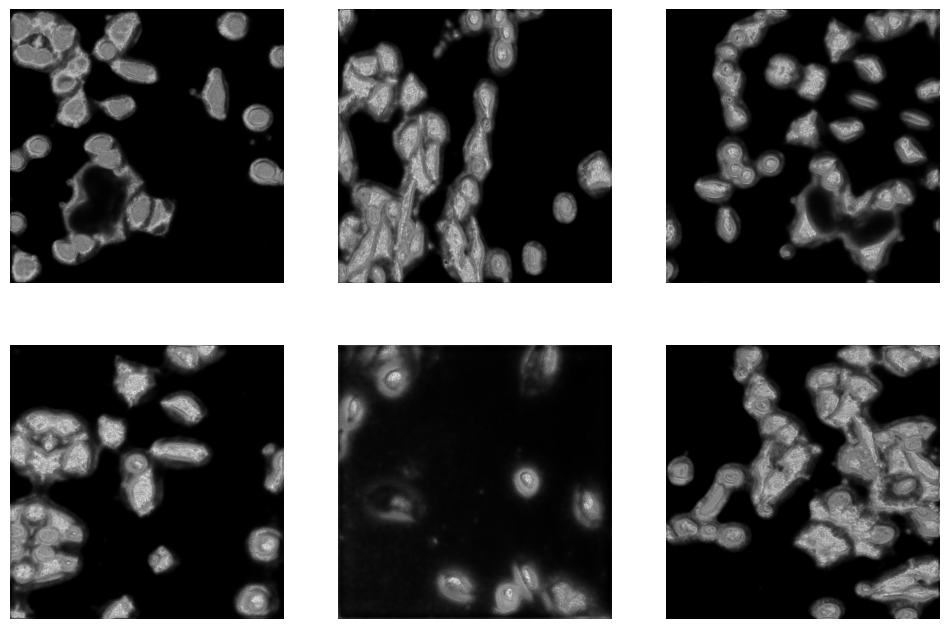

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Convert y_pred to a NumPy array
y_pred_array = np.array(predictions)

# Function to display 6 images in a 2x3 grid
def display_images(images):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i].squeeze(), cmap='gray')
        ax.axis('off')
    plt.show()

# Randomly select 6 images from the array
random_indices = np.random.choice(len(y_pred_array), size=6, replace=False)
selected_images = y_pred_array[random_indices]

# Display the selected images
display_images(selected_images)

### **Comparison of True and Predicted Masks for a Sample Test Image**

1/1 [==============================] - 0s 27ms/step


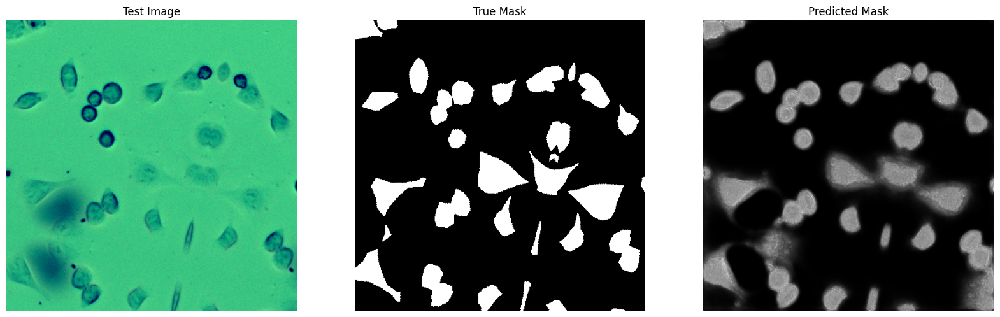

In [ ]:
# Getting a batch of images and masks from the test set
test_images, test_labels = next(test_set_generator)

# Predicting on a batch of images
predicted_labels = loaded_model.predict(test_images)

# Selecting the first image and mask from the batch
test_image = test_images[0]
test_label = test_labels[0, ..., 0]
predicted_label = predicted_labels[0, ..., 0]

# Normalizing the images for display
test_image = (test_image - test_image.min()) / (test_image.max() - test_image.min())
test_label = (test_label - test_label.min()) / (test_label.max() - test_label.min())
predicted_label = (predicted_label - predicted_label.min()) / (predicted_label.max() - predicted_label.min())

# Plotting the test image, true mask, and predicted mask
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

axs[0].imshow(test_image)
axs[0].set_title('Test Image')

axs[1].imshow(test_label, cmap='gray')
axs[1].set_title('True Mask')

axs[2].imshow(predicted_label, cmap='gray')
axs[2].set_title('Predicted Mask')

for ax in axs:
    ax.axis('off')

plt.show()


### **Results for Residual attention Unet**

In [ ]:
t = test_img_generator.next()
m = test_mask_generator.next()

evaluation_metrics(loaded_model,t,m)

1/1 [==============================] - 0s 26ms/step

Mean of Recall is: 0.865563
Mean of Precision is: 1.000000
Mean of Accuracy is: 0.865563
Mean of F1 is: 0.927772


Mean of IoU is: 0.865563

Mean of DICE is: 0.927772


### **Displaying the Results in Graphical View**

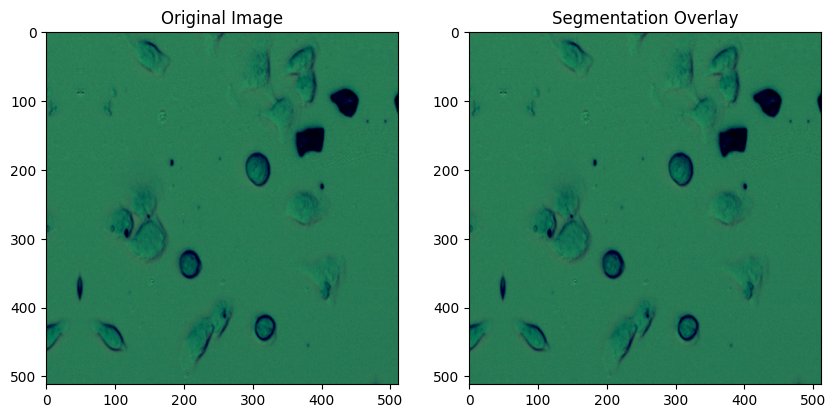

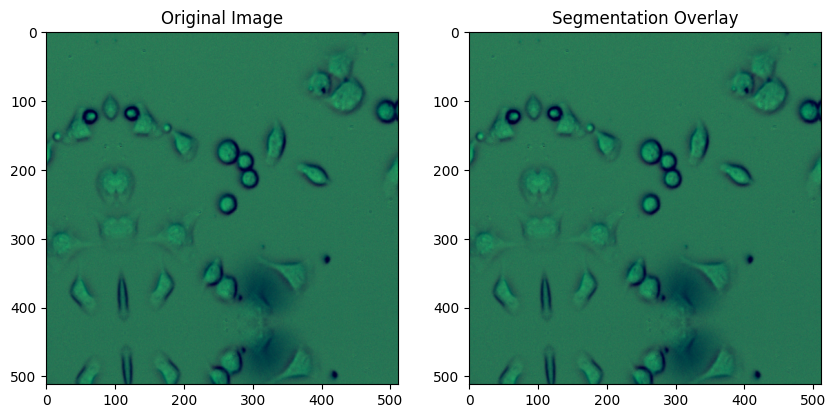

In [ ]:
alpha = 0.5
for idx, (imgs, masks) in enumerate(test_set_generator):
    if idx == 2:
        break

    predicted_mask = predictions[idx].squeeze() > 0.5
    original_img = (imgs[0] * 255).astype(np.uint8)

    overlay = original_img.copy()
    overlay[predicted_mask] = [255, 0, 0]

    output = cv2.addWeighted(original_img, alpha, overlay, 1 - alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(output)
    plt.title("Segmentation Overlay")

    plt.show()

### **Visualization of Predicted Probabilities as Heatmaps for Selected Batches**

25/25 [==============================] - 14s 567ms/step


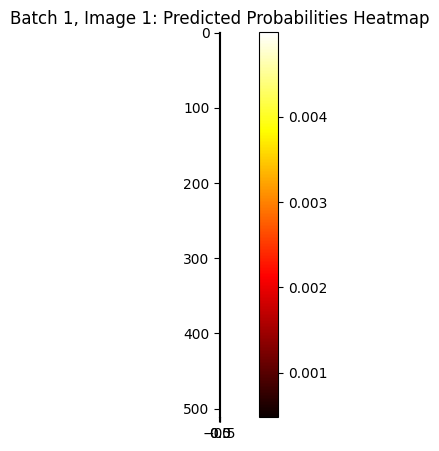

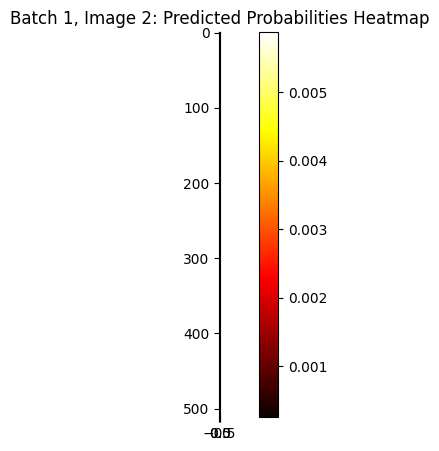

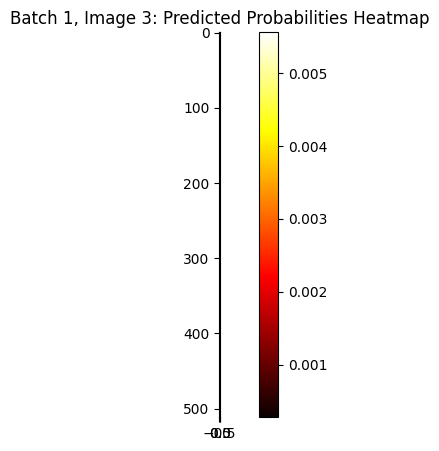

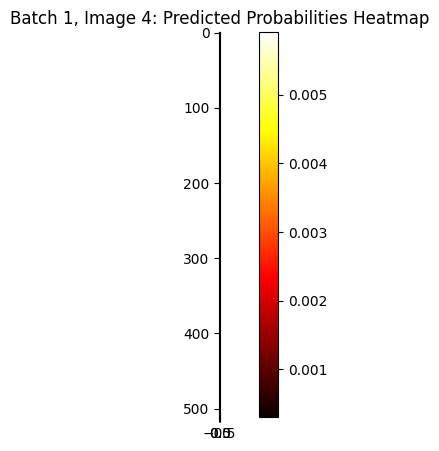

In [ ]:
test_set_generator = zip(test_img_generator, test_mask_generator)
predictions = loaded_model.predict(test_set_generator, steps=len(test_img_generator))

# Number of batches to visualize.
num_batches_to_visualize = 1

for batch_idx in range(num_batches_to_visualize):
    imgs = test_img_generator[batch_idx]
    true_masks = test_mask_generator[batch_idx]
    predicted_masks_batch = (predictions[batch_idx] > 0.5).astype(np.uint8)
    predicted_probabilities_batch = predictions[batch_idx]  # Direct probabilities

    for i in range(imgs.shape[0]):  # Looping through each image in the batch
        predicted_probability = predicted_probabilities_batch[i]

        if predicted_probability.ndim > 2:
            predicted_probability = predicted_probability.squeeze(-1)

        plt.figure(figsize=(10, 5))

        plt.imshow(predicted_probability, cmap='hot', interpolation='nearest')
        plt.colorbar()
        plt.title(f"Batch {batch_idx+1}, Image {i+1}: Predicted Probabilities Heatmap")
        plt.show()

#**Unet ++**

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, concatenate

def conv_block(m, dim, acti, bn, res, do=0):
    n = Conv2D(dim, 3, activation=acti, padding='same')(m)
    n = BatchNormalization()(n) if bn else n
    n = Dropout(do)(n) if do else n
    n = Conv2D(dim, 3, activation=acti, padding='same')(n)
    n = BatchNormalization()(n) if bn else n
    return concatenate([m, n]) if res else n

def level_block(m, dim, depth, inc, acti, do, bn, mp, up, res):
    if depth > 0:
        n = conv_block(m, dim, acti, bn, res)
        m = MaxPooling2D()(n) if mp else Conv2D(dim, 3, strides=2, padding='same')(n)
        m = level_block(m, int(inc*dim), depth-1, inc, acti, do, bn, mp, up, res)
        if up:
            m = UpSampling2D()(m)
            m = Conv2D(dim, 2, activation=acti, padding='same')(m)
        else:
            m = Conv2DTranspose(dim, 3, strides=2, activation=acti, padding='same')(m)
        n = concatenate([n, m])
        m = conv_block(n, dim, acti, bn, res)
    else:
        m = conv_block(m, dim, acti, bn, res, do)
    return m

def UNetPP(img_shape, out_ch=1, start_ch=64, depth=4, inc_rate=2., activation='relu',
           dropout=0.5, batchnorm=False, maxpool=True, upconv=True, residual=False):
    i = Input(shape=img_shape)
    o = level_block(i, start_ch, depth, inc_rate, activation, dropout, batchnorm, maxpool, upconv, residual)
    o = Conv2D(out_ch, 1, activation='sigmoid')(o)
    return Model(inputs=i, outputs=o)

# Example usage:
model = UNetPP((512, 512, 3), start_ch=16, depth=4, batchnorm=True)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [ ]:
from tensorflow.keras.optimizers import Adam
import os

num_train_samples = sum([len(files) for r, d, files in os.walk("/content/drive/MyDrive/Dataset/spilit_x_image_train/")])
num_valid_samples = sum([len(files) for r, d, files in os.walk("/content/drive/MyDrive/Dataset/spilit_x_image_validate/")])

train_steps = np.ceil(num_train_samples / batch_size)
valid_steps = np.ceil(num_valid_samples / batch_size)

history = model.fit(
    training_set_generator,
    steps_per_epoch=train_steps,
    epochs=50,
    validation_data=validation_set_generator,
    validation_steps=valid_steps
)


Epoch 1/50
81/81 [==============================] - 210s 2s/step - loss: 0.5792 - accuracy: 0.7747 - val_loss: 0.3711 - val_accuracy: 0.8565
Epoch 2/50
81/81 [==============================] - 55s 679ms/step - loss: 0.3301 - accuracy: 0.8538 - val_loss: 0.2164 - val_accuracy: 0.8598
Epoch 3/50
81/81 [==============================] - 55s 682ms/step - loss: 0.1665 - accuracy: 0.8540 - val_loss: 0.1129 - val_accuracy: 0.8581
Epoch 4/50
81/81 [==============================] - 55s 685ms/step - loss: 0.0873 - accuracy: 0.8561 - val_loss: 0.0644 - val_accuracy: 0.8547
Epoch 5/50
81/81 [==============================] - 55s 684ms/step - loss: 0.0514 - accuracy: 0.8548 - val_loss: 0.0405 - val_accuracy: 0.8567
Epoch 6/50
81/81 [==============================] - 55s 687ms/step - loss: 0.0338 - accuracy: 0.8558 - val_loss: 0.0278 - val_accuracy: 0.8625
Epoch 7/50
81/81 [==============================] - 55s 681ms/step - loss: 0.0241 - accuracy: 0.8565 - val_loss: 0.0209 - val_accuracy: 0.8483
E

### **Save The Model**

In [ ]:
# Save the model to Google Drive
model_save_path = '/content/drive/MyDrive/Dataset/unet_plus.h5'
model.save(model_save_path)

### **Load The Model**

In [ ]:
from tensorflow import keras

saved_model_path = "/content/drive/MyDrive/Dataset/unet_plus.h5"

# Load the model
loaded_model = keras.models.load_model(saved_model_path)

# Print model summary to check if it is loaded correctly
loaded_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_70 (Conv2D)             (None, 512, 512, 16  448         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_44 (BatchN  (None, 512, 512, 16  64         ['conv2d_70[0][0]']              
 ormalization)                  )                                                           

In [ ]:
test_img_data_generator = ImageDataGenerator(**img_gen_args)
test_img_generator = test_img_data_generator.flow_from_directory(
    "/content/drive/MyDrive/Dataset/spilit_x_image_test/",
    seed=seed,
    batch_size=batch_size,
    target_size=(512, 512),
    class_mode=None
)


test_mask_data_generator = ImageDataGenerator(**mask_gen_args)
test_mask_generator = test_mask_data_generator.flow_from_directory(
    "/content/drive/MyDrive/Dataset/spilit_y_mask_test/",
    seed=seed,
    batch_size=batch_size,
    target_size=(512, 512),
    color_mode='grayscale',  # Read masks in grayscale
    class_mode=None
)

# Generating predictions on test data
test_set_generator = zip(test_img_generator, test_mask_generator)

predictions = model.predict(test_set_generator, steps=len(test_img_generator))


Found 100 images belonging to 1 classes.
Found 100 images belonging to 1 classes.
25/25 [==============================] - 13s 512ms/step


### **Calculating Accuracy of Model**

In [ ]:
from sklearn.metrics import accuracy_score


threshold = 0.5

# Processing predictions and ground truth masks
y_true = []
y_pred = []

for i in range(len(test_img_generator)):
    images, masks = next(test_set_generator)


    predicted_masks = (model.predict(images) > threshold).astype(int)

    # Convert grayscale masks to binary masks (0 or 1)
    masks = (masks > 0).astype(int)

    y_true.extend(masks.flatten())
    y_pred.extend(predicted_masks.flatten())

# Calculate accuracy
accuracy = accuracy_score(y_true, y_pred)

print("Accuracy:", accuracy)


1/1 [==============================] - 0s 26ms/step
Accuracy: 0.8518957138061524


## **Random Visualization of Six Predicted Masks**

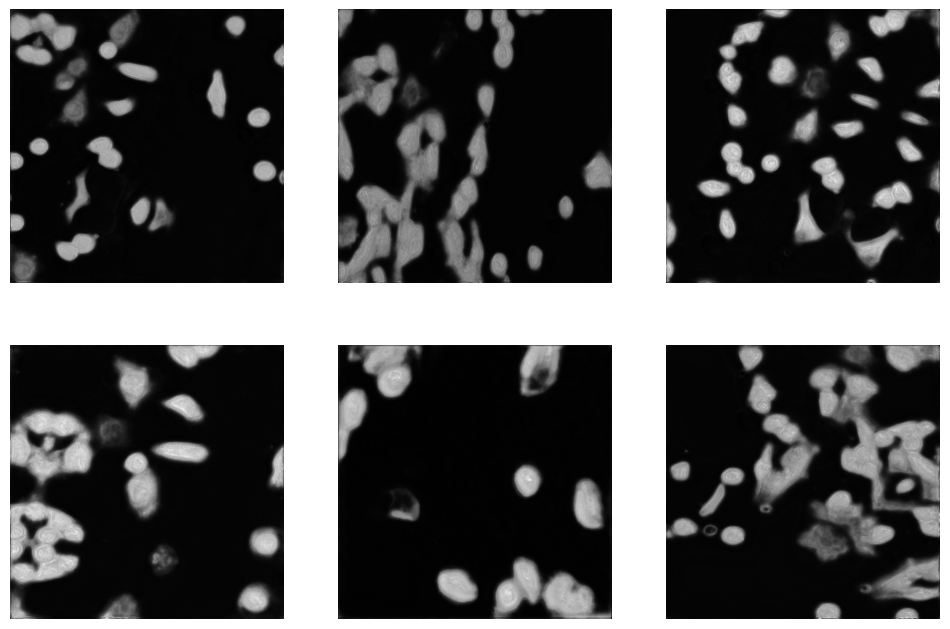

In [ ]:
import numpy as np
import matplotlib.pyplot as plt



# Convert y_pred to a NumPy array
y_pred_array = np.array(predictions)

# Function to display 6 images in a 2x3 grid
def display_images(images):
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i].squeeze(), cmap='gray')
        ax.axis('off')
    plt.show()

# Randomly select 6 images from the array
random_indices = np.random.choice(len(y_pred_array), size=6, replace=False)
selected_images = y_pred_array[random_indices]

# Display the selected images
display_images(selected_images)

### **Comparison of True and Predicted Masks for a Sample Test Image**

1/1 [==============================] - 0s 28ms/step


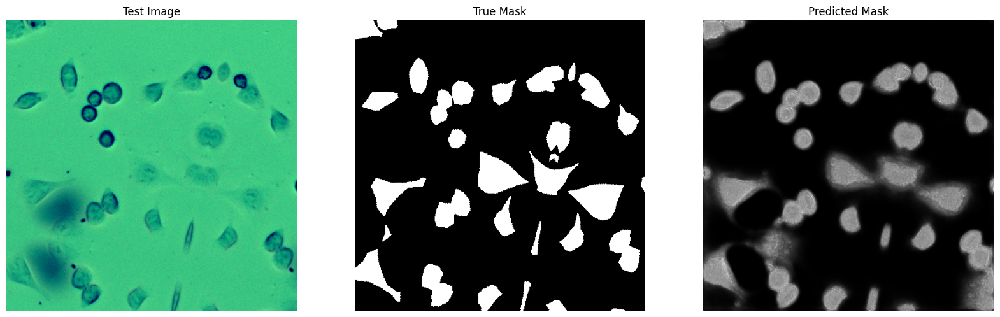

In [ ]:
# Getting a batch of images and masks from the test set
test_images, test_labels = next(test_set_generator)

# Predicting on a batch of images
predicted_labels = loaded_model.predict(test_images)

# Selecting the first image and mask from the batch
test_image = test_images[0]
test_label = test_labels[0, ..., 0]
predicted_label = predicted_labels[0, ..., 0]

# Normalizing the images for display
test_image = (test_image - test_image.min()) / (test_image.max() - test_image.min())
test_label = (test_label - test_label.min()) / (test_label.max() - test_label.min())
predicted_label = (predicted_label - predicted_label.min()) / (predicted_label.max() - predicted_label.min())

# Plotting the test image, true mask, and predicted mask
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

axs[0].imshow(test_image)
axs[0].set_title('Test Image')

axs[1].imshow(test_label, cmap='gray')
axs[1].set_title('True Mask')

axs[2].imshow(predicted_label, cmap='gray')
axs[2].set_title('Predicted Mask')

for ax in axs:
    ax.axis('off')

plt.show()


### **Results For UNet++**

In [ ]:
t = test_img_generator.next()
m = test_mask_generator.next()

evaluation_metrics(loaded_model,t,m)

1/1 [==============================] - 0s 23ms/step

Mean of Recall is: 0.897323
Mean of Precision is: 1.000000
Mean of Accuracy is: 0.897323
Mean of F1 is: 0.945804


Mean of IoU is: 0.897323

Mean of DICE is: 0.945804


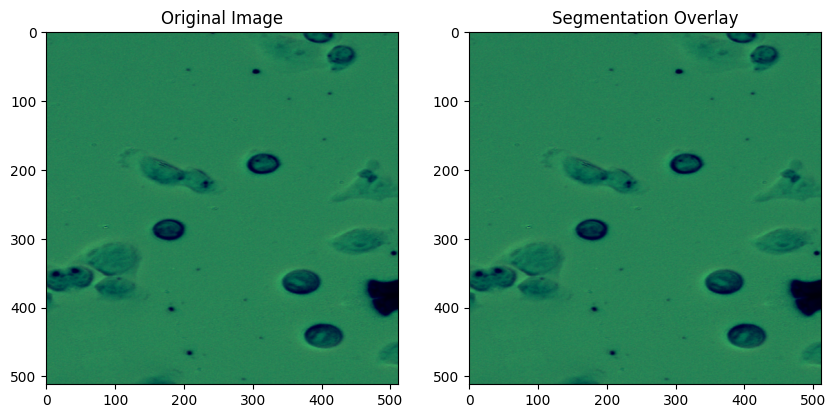

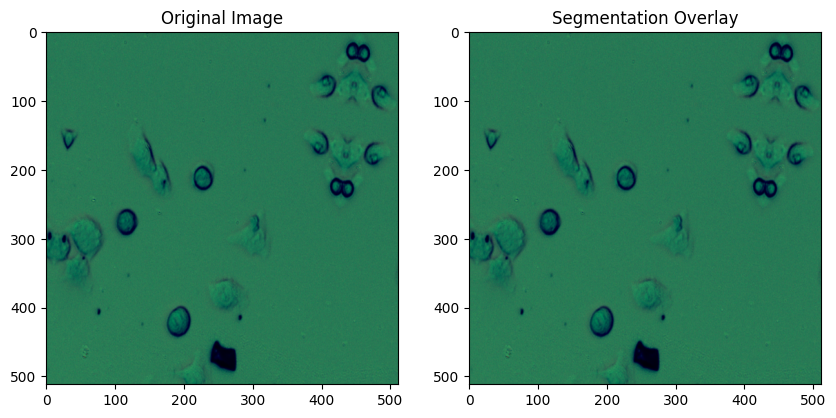

In [ ]:
alpha = 0.5
for idx, (imgs, masks) in enumerate(test_set_generator):
    if idx == 2:
        break

    predicted_mask = predictions[idx].squeeze() > 0.5
    original_img = (imgs[0] * 255).astype(np.uint8)

    overlay = original_img.copy()
    overlay[predicted_mask] = [255, 0, 0]

    output = cv2.addWeighted(original_img, alpha, overlay, 1 - alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(output)
    plt.title("Segmentation Overlay")

    plt.show()

25/25 [==============================] - 14s 587ms/step


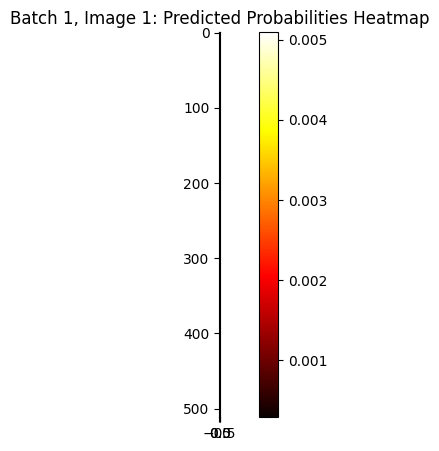

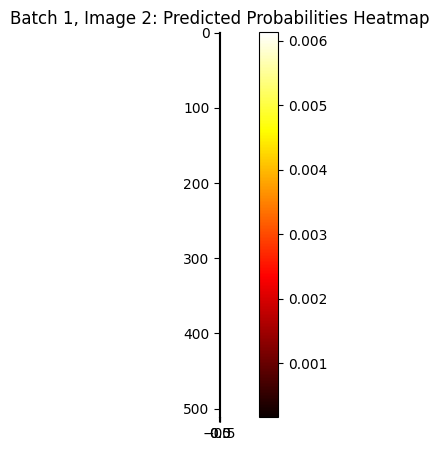

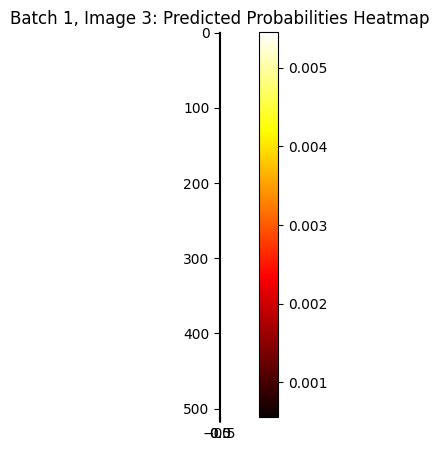

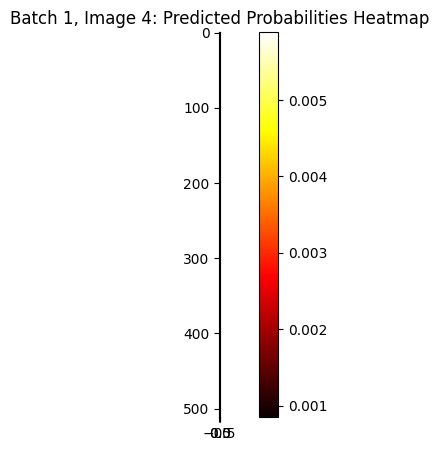

In [ ]:
test_set_generator = zip(test_img_generator, test_mask_generator)
predictions = loaded_model.predict(test_set_generator, steps=len(test_img_generator))

# Number of batches to visualize.
num_batches_to_visualize = 1

for batch_idx in range(num_batches_to_visualize):
    imgs = test_img_generator[batch_idx]
    true_masks = test_mask_generator[batch_idx]
    predicted_masks_batch = (predictions[batch_idx] > 0.5).astype(np.uint8)
    predicted_probabilities_batch = predictions[batch_idx]  # Direct probabilities

    for i in range(imgs.shape[0]):  # Looping through each image in the batch
        predicted_probability = predicted_probabilities_batch[i]

        if predicted_probability.ndim > 2:
            predicted_probability = predicted_probability.squeeze(-1)

        plt.figure(figsize=(10, 5))

        plt.imshow(predicted_probability, cmap='hot', interpolation='nearest')
        plt.colorbar()
        plt.title(f"Batch {batch_idx+1}, Image {i+1}: Predicted Probabilities Heatmap")
        plt.show()

### **Displaying the First Two Grayscale Predictions**

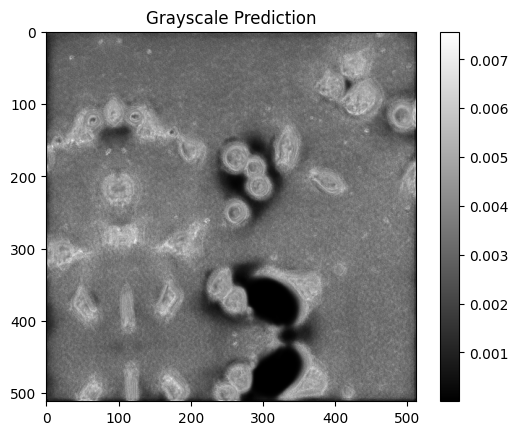

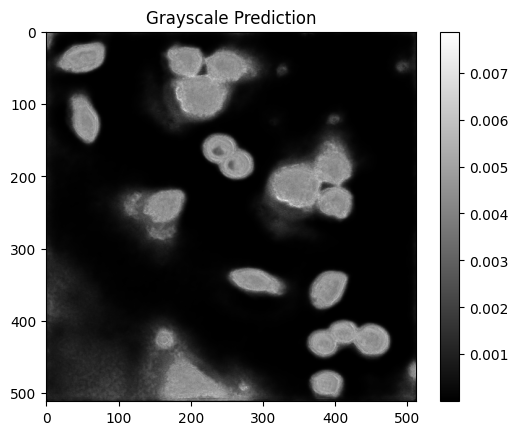

In [ ]:
for idx, pred in enumerate(predictions[:2]):
    plt.figure()
    plt.imshow(pred[:,:,0], cmap='gray')
    plt.title('Grayscale Prediction')
    plt.colorbar()
    plt.show()

### **Applying Watershed method on one of the model**

<ipython-input-42-61c47c97e22d>:18: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = peak_local_max(distance_transform, indices=False, footprint=np.ones((3, 3)))


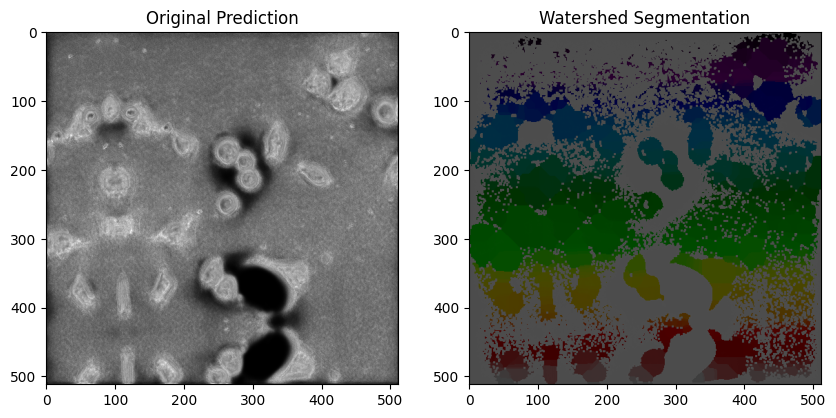

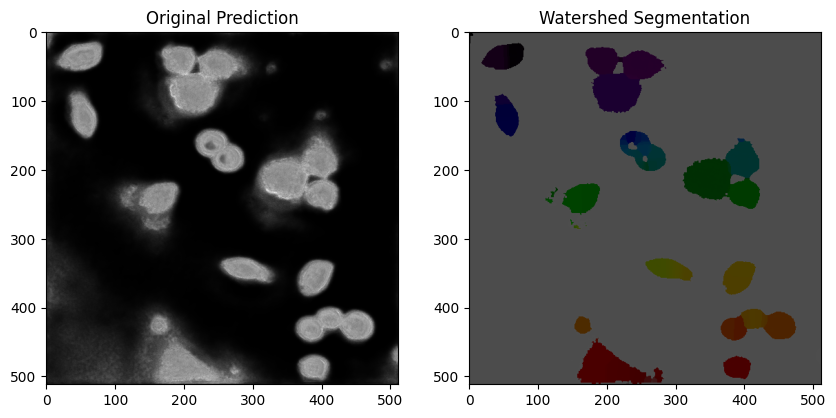

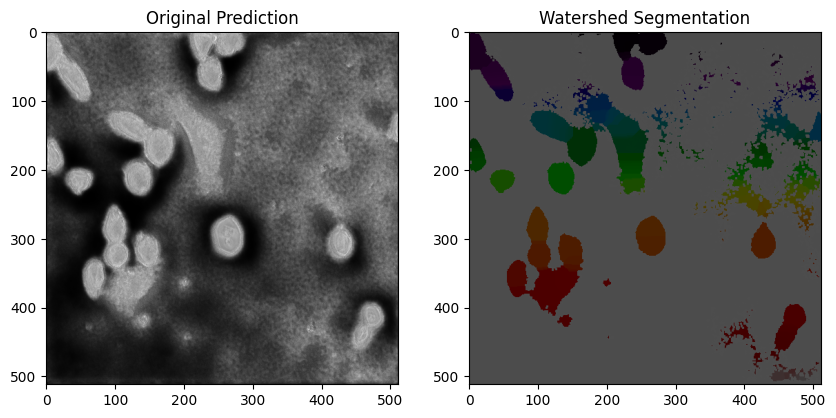

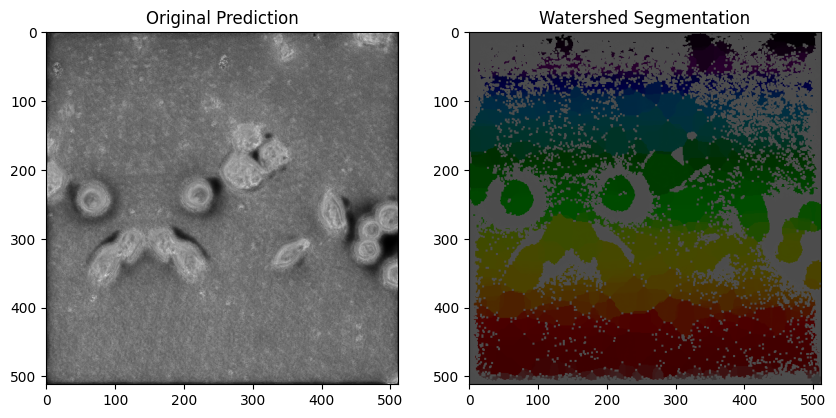

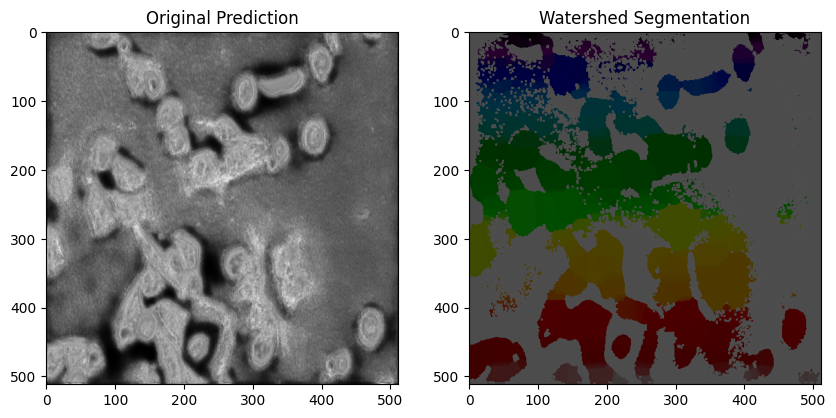

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt, label
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
from skimage.color import label2rgb
from skimage.morphology import erosion, square

# Threshold
threshold = 0.003

# Compute Distance Transform
def compute_distance_transform(binary_mask):
    return distance_transform_edt(binary_mask)

# Compute Local Maxima
def compute_local_maxima(distance_transform):
    local_maxi = peak_local_max(distance_transform, indices=False, footprint=np.ones((3, 3)))
    markers, _ = label(local_maxi)
    return markers

# Apply Watershed
def apply_watershed(distance, markers, binary_mask):
    return watershed(-distance, markers, mask=binary_mask)

# Erosion to separate cells
def erode_binary_mask(binary_mask):
    return erosion(binary_mask, square(3))  # You can adjust the square size for more/less erosion

# Visualization
for idx, pred in enumerate(predictions[:5]):
    binary = (pred[:,:,0] > threshold).astype(np.uint8)
    eroded_binary = erode_binary_mask(binary)

    distance = compute_distance_transform(eroded_binary)
    markers = compute_local_maxima(distance)
    watershed_img = apply_watershed(distance, markers, eroded_binary)

    # Convert segmented regions to different colors using a colormap
    cmap = plt.cm.nipy_spectral

    # Set background color to white
    watershed_on_original = label2rgb(watershed_img, image=pred[:,:,0], bg_label=0, bg_color=(1, 1, 1), colors=[cmap(each) for each in np.linspace(0, 1, watershed_img.max() + 1)])

    plt.figure(figsize=(10, 5))

    # Display original prediction
    plt.subplot(1, 2, 1)
    plt.imshow(pred[:,:,0], cmap='gray')
    plt.title('Original Prediction')

    # Display Watershed image
    plt.subplot(1, 2, 2)
    plt.imshow(watershed_on_original)
    plt.title('Watershed Segmentation')

    plt.show()


### **Finding Best Threshold**

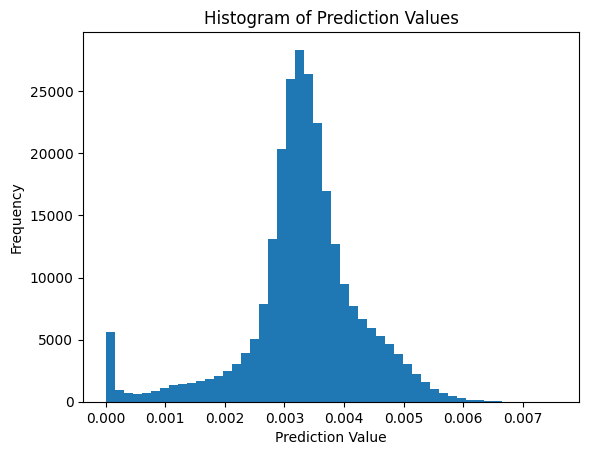

In [ ]:
plt.hist(predictions[0].ravel(), bins=50)
plt.title('Histogram of Prediction Values')
plt.xlabel('Prediction Value')
plt.ylabel('Frequency')
plt.show()


### **Applying Watershed with best threshold**

<ipython-input-44-ac5bd76adbb7>:12: FutureWarning: indices argument is deprecated and will be removed in version 0.20. To avoid this warning, please do not use the indices argument. Please see peak_local_max documentation for more details.
  local_maxi = peak_local_max(distance_transform, indices=False, footprint=np.ones((3, 3)))


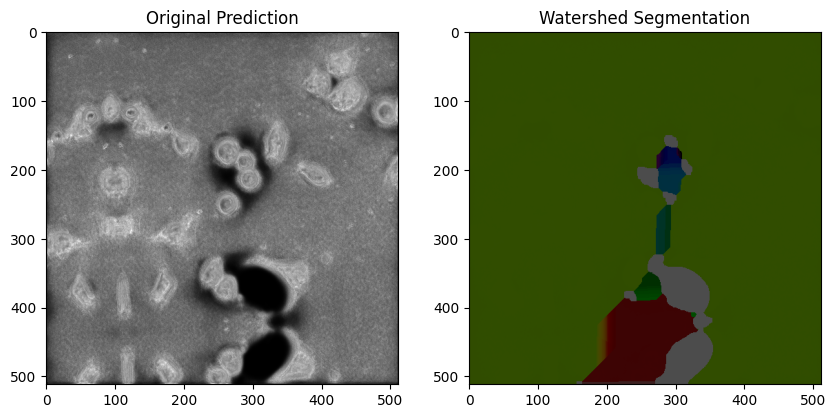

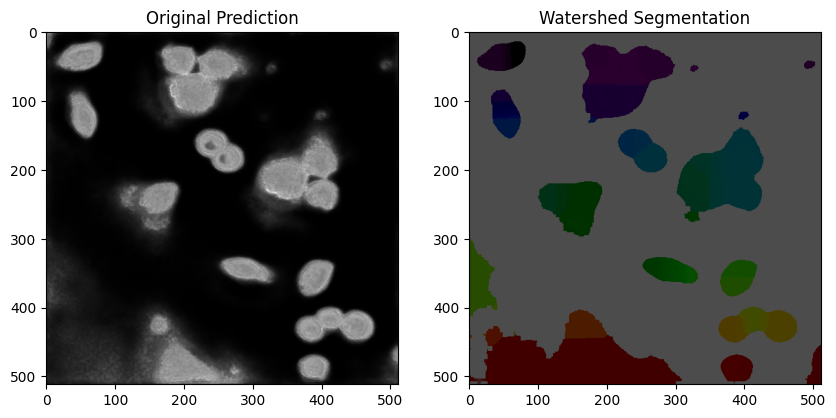

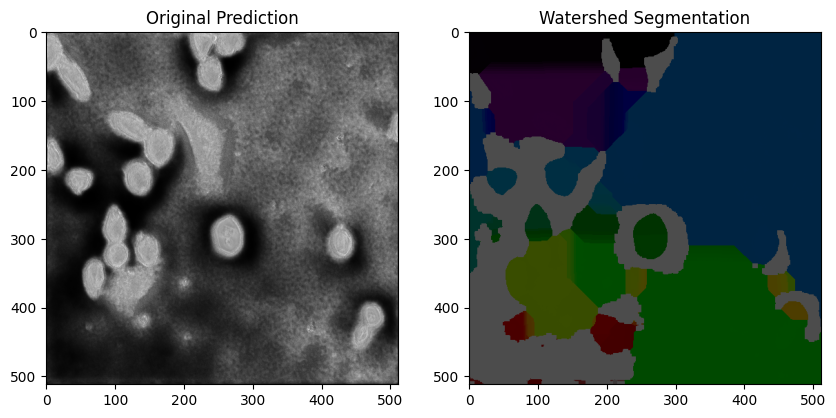

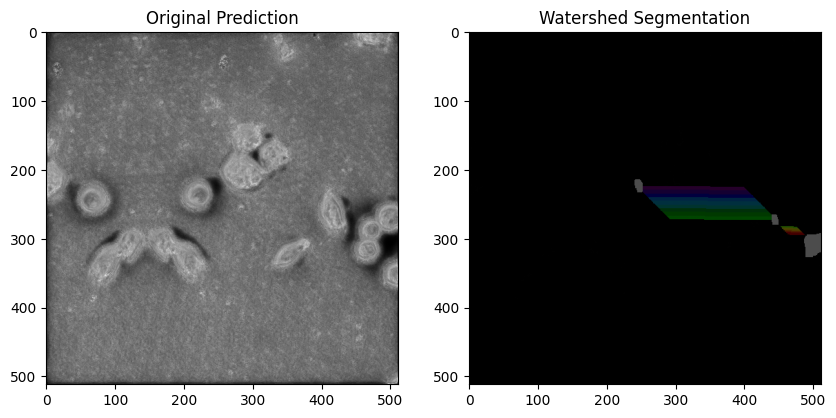

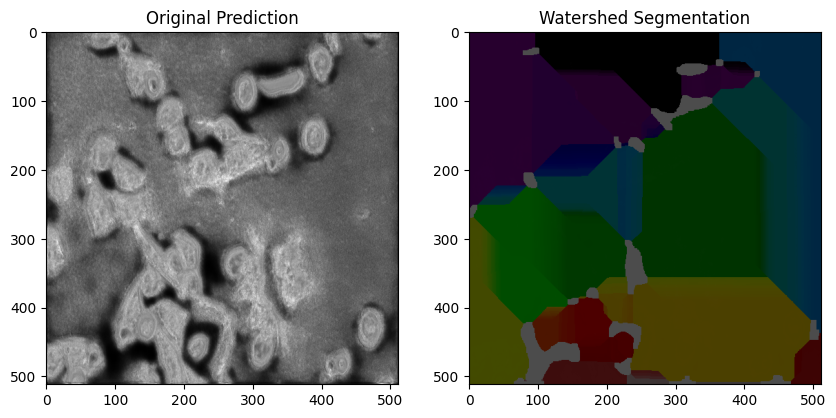

In [ ]:
from skimage.morphology import dilation, closing

# Threshold
threshold = 0.001

# Compute Distance Transform
def compute_distance_transform(binary_mask):
    return distance_transform_edt(binary_mask)

# Compute Local Maxima
def compute_local_maxima(distance_transform):
    local_maxi = peak_local_max(distance_transform, indices=False, footprint=np.ones((3, 3)))
    markers, _ = label(local_maxi)
    return markers

# Apply Watershed
def apply_watershed(distance, markers, binary_mask):
    return watershed(-distance, markers, mask=binary_mask)

# Erosion to separate cells
def erode_binary_mask(binary_mask):
    return erosion(binary_mask, square(3))  # You can adjust the square size for more/less erosion

# Dilation to increase the distance between cells
def dilate_binary_mask(binary_mask):
    return dilation(binary_mask, square(3))

# Closing: A dilation followed by an erosion
def closing_binary_mask(binary_mask):
    return closing(binary_mask, square(5))

# Visualization
for idx, pred in enumerate(predictions[:5]):
    binary = (pred[:,:,0] > threshold).astype(np.uint8)

    # Apply closing to increase distance between adjacent cells
    closed_binary = closing_binary_mask(binary)
    eroded_binary = erode_binary_mask(closed_binary)

    distance = compute_distance_transform(eroded_binary)
    markers = compute_local_maxima(distance)
    watershed_img = apply_watershed(distance, markers, eroded_binary)

    # Convert segmented regions to different colors using a colormap
    cmap = plt.cm.nipy_spectral

    # Set background color to white
    watershed_on_original = label2rgb(watershed_img, image=pred[:,:,0], bg_label=0, bg_color=(1, 1, 1), colors=[cmap(each) for each in np.linspace(0, 1, watershed_img.max() + 1)])

    plt.figure(figsize=(10, 5))

    # Display original prediction
    plt.subplot(1, 2, 1)
    plt.imshow(pred[:,:,0], cmap='gray')
    plt.title('Original Prediction')

    # Display Watershed image
    plt.subplot(1, 2, 2)
    plt.imshow(watershed_on_original)
    plt.title('Watershed Segmentation')

    plt.show()


# **Showing Accuracy and Validation Curves for model training**

There is history variable used in each model. Load history variable of each model to get the results.

Below is the history varaible used for UNET++ Model.

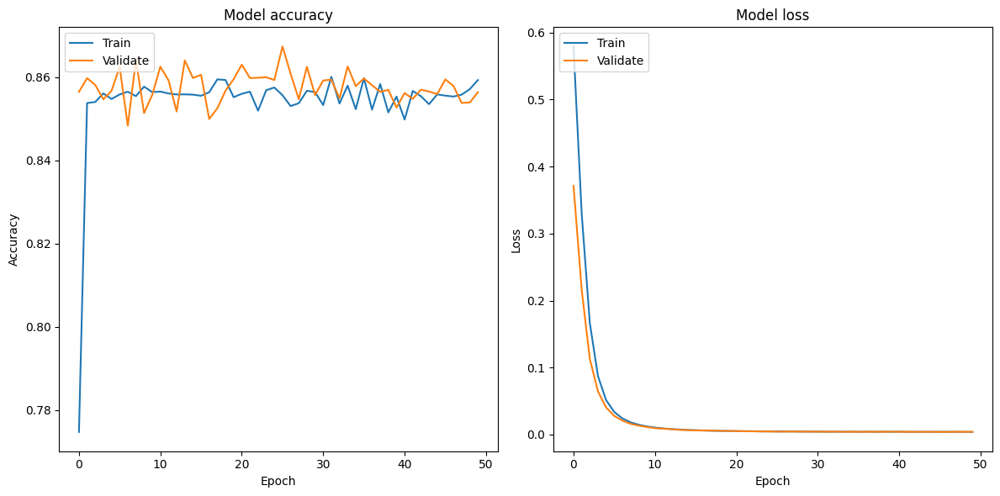

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))

# if 'accuracy' in history.history:
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validate'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validate'], loc='upper left')

plt.tight_layout()
plt.show()
